   Elevation  Aspect  Slope  Horizontal_Distance_To_Hydrology  \
0       2596      51      3                               258   
1       2590      56      2                               212   
2       2804     139      9                               268   
3       2785     155     18                               242   
4       2595      45      2                               153   

   Vertical_Distance_To_Hydrology  Horizontal_Distance_To_Roadways  \
0                               0                              510   
1                              -6                              390   
2                              65                             3180   
3                             118                             3090   
4                              -1                              391   

   Hillshade_9am  Hillshade_Noon  Hillshade_3pm  \
0            221             232            148   
1            220             235            151   
2            234             238   

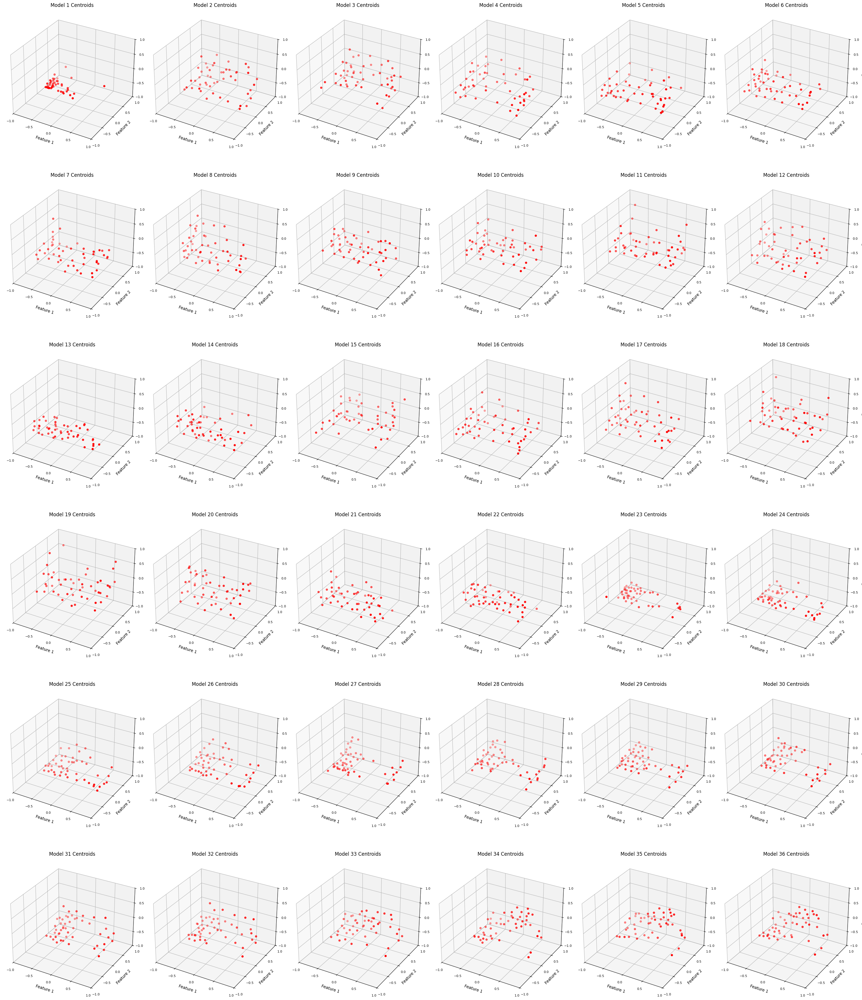

[-0.72693915 -0.05555641 -0.6144249 ]
[-0.73724951  0.18685692 -0.62520038]
[-0.75416124  0.18778755 -0.54638176]
[-0.70981779  0.10571879 -0.63433524]
[-0.68706147  0.40721928 -0.59998788]
[-0.71564869  0.12810662 -0.58345856]
[-0.70799934  0.15747589 -0.54193384]
[-0.66224951  0.18685692 -0.52520038]
[-0.67466601  0.19080923 -0.45860051]
[-0.67459921 -0.04602893 -0.61532061]
[-0.63724951  0.13685692 -0.57520038]
[-0.63724951  0.18685692 -0.45020038]
[-0.64133268  0.10747589 -0.64193384]
[-0.54484135  0.55777554 -0.23089933]
[-0.66439622  0.24687099 -0.34513931]
[-0.58724951  0.21185692 -0.52520038]
[-0.5081526  -0.13446819 -0.48187831]
[-0.60799934  0.07414256 -0.60860051]
[-0.57466601 -0.05919077 -0.59193384]
[-0.6388563  -0.05467385 -0.6110578 ]
[-0.42932906  0.17867695 -0.60290083]
[-0.50799934  0.14080923 -0.54193384]
[-0.33724951 -0.01314308 -0.65020038]
[-0.28724951 -0.01314308 -0.65020038]
[-0.40799934  0.14080923 -0.52526717]
[-0.41171691 -0.01372846 -0.65179964]
[-0.08273552

In [1]:
import csv

import numpy as np
import pandas as pd
from scipy.stats import zscore
from sklearn import preprocessing
import time


class Preprocessing:
    def __init__(self, data):
        # self.filename = file_path
        self.data = data
        # self.data = self.data.rename(columns={"type": "label"})
        # self.data = self.data.rename(columns={"label": "label"})
        self.correlation_threshold = 0.5
        self.attribute_size = 42
        self.column_name = []

    def categorical_to_numerical(self):  # using label encoding method
        for column in self.data.columns:
            if self.data[column].dtype == 'object' or self.data[column].dtype.name == 'category':
                # Convert categorical columns to category type and then to codes (numerical)
                self.data[column] = self.data[column].astype('category')
                self.data[column] = self.data[column].cat.codes
                # Print the column name that was converted
                print(f"Column '{column}' has been converted to numeric.")
        self.data.fillna(0)

    def filter_method(self):  # dimention reduction
        cor = self.data.corr()
        cor_column = abs(cor['label']).tolist()
        column_index = 0
        for column in self.data.columns:  # selecting relative features
            self.column_name.append(column)
            if abs(cor_column[column_index]) < self.correlation_threshold:
                self.data.drop(column, axis=1, inplace=True)
                self.column_name.remove(column)
            column_index += 1
        for i in range(len(self.data.columns)):
            for j in range(i + 1, len(self.data.columns)):
                cor_column = abs(cor[self.data.columns[i]]).tolist()
                if abs(cor_column[j]) < self.correlation_threshold:
                    self.data.drop(self.data.columns[i], axis=1, inplace=True)
                    self.column_name.remove(self.data.columns[i])

    def standardization(self):
        scaler = preprocessing.StandardScaler().fit(self.data)
        self.data = scaler.transform(self.data)

    def run(self):
        # label_names = self.data["label"]
        self.categorical_to_numerical()
        # self.filter_method()
        # self.standardization()
        # self.data = self.data.tolist()
        # self.attribute_size = len(self.data[0])
        return self.data


import numpy as np
from sklearn.cluster import KMeans
from collections import deque
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import random
import math


# from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_information_score, davies_bouldin_score


class MicroCluster:
    def __init__(self, centroid, radius, count=1):
        self.centroid = np.array(centroid)
        self.radius = radius
        self.count = count
        # self.normal = 0
        # self.attack = 0
        self.records = [0 for i in range(7)]
        self.records_location = [[] for i in range(7)]
        self.point_locations = []

    def calculate_distance(self, point, centroid):
        # point = np.array(point)
        # centroid = np.array(centroid)
        
        # Calculate the Euclidean distance using np.linalg.norm
        distance = np.linalg.norm(centroid - point)
        return distance


    def update(self, point, label):
        # Incrementally update the centroid and radius     
        self.count += 1
        # old_centroid = self.centroid.copy()
        self.centroid = (self.centroid * (self.count - 1) + point) / self.count
        # self.radius = np.linalg.norm(self.centroid - old_centroid)  # Do not update the radius

        # if label == 0:
        #     self.normal+=1
        # if label == 1:
        #     self.attack+=1
        # print("this is records : ", self.records)
        # print("this is the label: ", label)
        
        self.records[int(label)] += 1
        self.records_location[int(label)].append((point,label))

        distance = self.calculate_distance(point, self.centroid)
        if distance > self.radius:
            return
        self.point_locations.append(point)
        
    def reset(self):
        # self.normal = 0
        # self.attack = 0
        self.record = [0 for i in range(7)]
        self.records_location = [[] for i in range(7)]
        self.point_locations = []


class Model:
    def __init__(self, clusters=None):
        if clusters is None:
            clusters = []
        self.clusters = clusters
    def reset(self):
        for cluster in self.clusters:
            cluster.reset()

    def record_attack_normal_counts(self):
        return [cluster.records for cluster in self.clusters]
    def get_records_location(self):
        return [cluster.records_location for cluster in self.clusters] 
    def get_point_locations(self):
        return [cluster.point_locations for cluster in self.clusters] 



import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Import the 3D plotting module
from scipy.spatial.distance import cdist

# Generate some sample data
np.random.seed(0)
data = np.random.rand(1000, 3)  # 1000 data points in 3 dimensions


def initialize_grid_manager(x_min, x_max, y_min, y_max, z_min, z_max, grid_size):
    """Initialize grid_manager as a 3D NumPy array to represent the cube grid."""

    # Calculate the number of grid cells along each axis
    x_bins = np.arange(x_min, x_max, grid_size)
    y_bins = np.arange(y_min, y_max, grid_size)
    z_bins = np.arange(z_min, z_max, grid_size)

    # Create a 3D numpy array for the grid manager, initialized to zeros
    grid_shape = (len(x_bins), len(y_bins), len(z_bins))
    grid_manager = np.zeros(grid_shape)  # Initialize with zeros

    return grid_manager


def update_grid(grid_manager, point, grid_size, decay_factor):
    x_min, x_max = -1, 1
    y_min, y_max = -1, 1
    z_min, z_max = -1, 1
    x_bins = np.arange(x_min, x_max, grid_size)
    y_bins = np.arange(y_min, y_max, grid_size)
    z_bins = np.arange(z_min, z_max, grid_size)

    x_index = np.digitize(point[0], x_bins) - 1
    y_index = np.digitize(point[1], y_bins) - 1
    z_index = np.digitize(point[2], z_bins) - 1
    grid_key = (x_index, y_index, z_index)

    grid_manager *= decay_factor
    grid_manager[x_index, y_index, z_index] += 1

    return grid_manager


def micro_clustering(grid_manager, grid_size, density_threshold, decay_factor, cluster__max_numbers=23):
    # Randomly sample 50 data points from the dataset
    # sample_size = data.shape[0]
    # # sample_indices = np.random.choice(data.shape[0], sample_size, replace=False)
    # # sampled_data = data[sample_indices]
    # sampled_data = data

    # Parameters for grid-based clustering
    grid_size = grid_size  # Smaller grid size for more granular clustering
    density_threshold = density_threshold  # Threshold adjusted for small samples

    # Create grid
    x_min, x_max = -1, 1
    y_min, y_max = -1, 1
    z_min, z_max = -1, 1
    x_bins = np.arange(x_min, x_max, grid_size)
    y_bins = np.arange(y_min, y_max, grid_size)
    z_bins = np.arange(z_min, z_max, grid_size)

    updated_keys = set()
    decay_factor = decay_factor  # Example decay factor

    # Identify clusters
    # for i in grid_manager.items():
    #     print(i[1].density, end= ", ")
    # print("")
    clusters = []

    # Iterate over all cells in the 3D grid and check density values
    it = np.nditer(grid_manager, flags=['multi_index'])
    for cell in it:
        if cell >= density_threshold:
            clusters.append(it.multi_index)

    # print(clusters)
    # print(clusters)
    # print(grid)
    cluster_centers = [
        (x_bins[coord[0]] + grid_size / 2, y_bins[coord[1]] + grid_size / 2, z_bins[coord[2]] + grid_size / 2) for coord
        in clusters]

    # Merge clusters to achieve exactly 5 clusters
    while len(cluster_centers) > cluster__max_numbers:
        distances = cdist(cluster_centers, cluster_centers)
        np.fill_diagonal(distances, np.inf)

        closest_pair = np.unravel_index(np.argmin(distances), distances.shape)
        new_center = np.mean([cluster_centers[closest_pair[0]], cluster_centers[closest_pair[1]]], axis=0)

        cluster_centers.pop(max(closest_pair))
        cluster_centers.pop(min(closest_pair))
        cluster_centers.append(tuple(new_center))
    # print("the numbers of clusters", len(cluster_centers), "sample size ", sample_size)
    return cluster_centers


import numpy as np
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import cdist


def micro_clustering_DBScan(data, sample_size=50, eps=0.1, min_samples=5, cluster__max_numbers=23):
    data = data[:, :-1]
    # Sample data points if sample_size is less than the total number of data points
    sample_size = data.shape[0]
    sample_indices = np.random.choice(data.shape[0], sample_size, replace=False)
    sampled_data = data[sample_indices]

    # Apply DBSCAN clustering
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(sampled_data)

    # Extract cluster centers by calculating the mean of points in each cluster
    cluster_centers = []
    unique_labels = set(labels)
    for label in unique_labels:
        if label == -1:
            # Skip noise points (label == -1)
            continue
        cluster_points = sampled_data[labels == label]
        cluster_center = np.mean(cluster_points, axis=0)
        cluster_centers.append(cluster_center)

    # If there are more clusters than desired, merge clusters
    while len(cluster_centers) > cluster__max_numbers:
        distances = cdist(cluster_centers, cluster_centers)
        np.fill_diagonal(distances, np.inf)

        closest_pair = np.unravel_index(np.argmin(distances), distances.shape)
        new_center = np.mean([cluster_centers[closest_pair[0]], cluster_centers[closest_pair[1]]], axis=0)

        cluster_centers.pop(max(closest_pair))
        cluster_centers.pop(min(closest_pair))
        cluster_centers.append(new_center)
    return cluster_centers


def find_matching_model(grid_manager, grid_size, density_threshold, models, percentage_threshold=0.95, ):

    grid_size = grid_size  # Smaller grid size for more granular clustering
    density_threshold = density_threshold  # Threshold adjusted for small samples

    # Create grid
    x_min, x_max = -1, 1
    y_min, y_max = -1, 1
    z_min, z_max = -1, 1
    x_bins = np.arange(x_min, x_max, grid_size)
    y_bins = np.arange(y_min, y_max, grid_size)
    z_bins = np.arange(z_min, z_max, grid_size)


    clusters = []

    # Iterate over all cells in the 3D grid and check density values
    it = np.nditer(grid_manager, flags=['multi_index'])
    for cell in it:
        if cell >= density_threshold:
            clusters.append(it.multi_index)

    # print(clusters)
    # print(clusters)
    # print(grid)
    cluster_centers = [
        (x_bins[coord[0]] + grid_size / 2, y_bins[coord[1]] + grid_size / 2, z_bins[coord[2]] + grid_size / 2) for coord
        in clusters]







    best_model = None
    max_match_percentage = 0
    min_total_error = float('inf')
    flag = -1
    best_model_index = 0

    for model in models:
        flag+=1
        max_match_percentage = percentage_threshold
        match_count = 0
        total_error = 0
        for sample in cluster_centers:
            closest_cluster = min(model.clusters, key=lambda cluster: np.linalg.norm(cluster.centroid - sample))
            distance = np.linalg.norm(closest_cluster.centroid - sample)
            if distance <= closest_cluster.radius:
                match_count += 1
            total_error += distance

        match_percentage = match_count / len(cluster_centers)
        print("match_percentage: ", match_percentage)
        if match_percentage > max_match_percentage:
            max_match_percentage = match_percentage
            best_model = model
            best_model_index = flag
            min_total_error = total_error
        elif match_percentage == max_match_percentage and total_error < min_total_error:
            best_model = model
            best_model_index = flag
            min_total_error = total_error

    return best_model , best_model_index


# class PageHinkley:
#     def __init__(self, delta=0.005, lambda_=30, alpha=0.99):
#         self.delta = delta
#         self.lambda_ = lambda_
#         self.alpha = alpha
#         self.cum_sum = 0
#         self.min_cum_sum = 0
#         self.m = 0
#         self.t = 0

#     def update(self, value):
#         self.t += 1
#         self.m = self.alpha * self.m + (1 - self.alpha) * value
#         self.cum_sum += value - self.m - self.delta
#         # print(self.cum_sum, self.min_cum_sum, self.cum_sum - self.min_cum_sum, self.lambda_)
#         if self.cum_sum < self.min_cum_sum:
#             self.min_cum_sum = self.cum_sum

#         if self.cum_sum - self.min_cum_sum > self.lambda_:

#             self.reset()
#             return True
#         return False

#     def reset(self):
#         self.cum_sum = 0
#         self.min_cum_sum = 0
#         self.m = 0
#         self.t = 0


class PageHinkley:
    def __init__(self, delta=0.005, lambda_W=50, lambda_A=100, warm_up_period=100, alpha=1 - 0.0001):
        self.delta = delta
        self.lambda_W = lambda_W
        self.lambda_A = lambda_A
        self.warm_up_period = warm_up_period
        self.reset()
        self.point_count = 0
        self.sum = 0
        self.alpha = alpha
        self.delta = delta
        self.M_T = float('inf')

    def reset(self):
        self.m_T = 0
        self.M_T = float('inf')
        self.cumulative_sum = []
        self.buffer = []
        self.point_count = 0

    def update(self, D_i, ):
        self.point_count += 1
        if len(self.cumulative_sum) == 0:
            self.mean_D_i = D_i
        else:
            self.mean_D_i = (self.mean_D_i * len(self.cumulative_sum) + D_i) / (len(self.cumulative_sum) + 1)

        deviation = D_i - self.mean_D_i - self.delta
        # deviation = D_i - self.mean_D_i
        # deviation = abs(deviation)
        self.m_T += deviation
        self.cumulative_sum.append(deviation)

        self.M_T = min(abs(self.M_T), abs(self.m_T))

        if self.point_count <= self.warm_up_period:
            return False

        # print(self.m_T, self.M_T, "diffrent: ", self.m_T- self.M_T )
        # print(D_i)
        # print(D_i)
    
        if abs(self.m_T - self.M_T) > self.lambda_A:
            print("Alarm: Concept drift detected")
            # self.buffer.append(D_i)
            # print("------------------------------------------------------------ di", D_i, self.m_T, self.M_T)
            self.reset()
            return "alarm"

        if abs(self.m_T - self.M_T) > self.lambda_W:
            # print("Warning: Possible concept drift detected")
            # self.buffer.append(D_i)
            return "warning"

        return False


def calculate_model_accuracy(data, model):
    # Calculate distances and assign points to the nearest centroid
    clusters_points = {i: [] for i in range(len(model.clusters))}
    for point in data.values:
        distances = [np.linalg.norm(cluster.centroid - point[:-1]) for cluster in model.clusters]
        nearest_cluster_index = np.argmin(distances)
        #  ---------------------------------------------------------------------- inja mishe limit gozasht vaseye distance (outlayer detection)
        clusters_points[nearest_cluster_index].append(point)

    accuracies = []
    correct_count = 0
    total_count = 0

    # Prepare a 3D plot for the clusters
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    for cluster_index, points in clusters_points.items():
        if points:
            labels, counts = np.unique([point[-1] for point in points], return_counts=True)
            dominant_label_index = counts.argmax()
            dominant_label = labels[dominant_label_index]
            dominant_label_count = counts[dominant_label_index]
            accuracy = dominant_label_count / len(points)
            accuracies.append(accuracy)

            # cluster_predicted_label = "normal" if label_dict[dominant_label] == "normal" else "attack"
            # for point in points:
            #     true_label = "normal" if label_dict[point[-1]] == "normal" else "attack"
            #     if true_label == cluster_predicted_label:
            #         correct_count += 1  # Count correctly classified points

            # # Update total count of points

            correct_count += dominant_label_count
            total_count += len(points)

            for point in points:
                true_label = point[-1]
                color = 'g' if true_label == 0 else 'r'  # Green for normal, Red for attack
                ax.scatter(point[0], point[1], point[2], c=color, alpha=0.6)

            # Plot the centroid of the cluster
            centroid = model.clusters[cluster_index].centroid
            ax.scatter(centroid[0], centroid[1], centroid[2], c='blue', marker='x', s=100)  # Blue 'x' for centroids

            print(
                f"Cluster {cluster_index} Accuracy: {accuracy * 100:.2f}%, Cluster label: {label_dict[dominant_label]}")

    # model_accuracy = np.mean(accuracies) if accuracies else 0
    model_accuracy = correct_count / total_count if total_count else 0
    print(f"Model Accuracy: {model_accuracy * 100:.2f}%")

    # Set plot labels and title
    ax.set_title('Cluster Visualization (Normal vs. Attack)')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_zlabel('Feature 3')

    # Show plot
    plt.tight_layout()
    plt.show()

    return model_accuracy




def box_counting_dimension(grid, min_box_size, density_threshold):
    """
    Estimates the Hausdorff fractal dimension of a 3D grid using the box-counting method,
    and plots both the raw and logarithmic scales of box sizes and counts.

    :param grid: 3D numpy array representing density in the grid.
    :param min_box_size: Minimum box size to start counting. Must be a power of 2 and > 1.
    :return: Estimated fractal dimension.
    """
    assert grid.ndim == 3, "Input grid must be 3-dimensional"
    assert np.any(grid), "Grid must contain some non-zero values"

    size = max(grid.shape)
    box_sizes = []
    counts = []

    # Dynamically adjust box sizes based on grid size
    box_size = min_box_size
    while box_size <= size:
        count = 0
        for x in range(0, size, box_size):
            for y in range(0, size, box_size):
                for z in range(0, size, box_size):
                    if np.sum(grid[x:x + box_size, y:y + box_size, z:z + box_size]) > density_threshold:
                        count += 1
        box_sizes.append(box_size)
        counts.append(count)
        # box_size *= 2
        box_size += 1

    log_box_sizes = np.log(1 / np.array(box_sizes))
    log_counts = np.log(np.array(counts))

    slope, intercept = np.polyfit(log_box_sizes, log_counts, 1)
    
    return slope




# Simulation of the stream
def simulate_stream(data, decay_factor, density_threshold, cluster_radius, grid_size, test_phase, window_size=500,
                    numberOfLabels=23):
    # label_column = data.pop('label')
    models = []
    window = deque(maxlen=window_size)
    ph_test = PageHinkley(delta=0.001, lambda_W=2, lambda_A=5, warm_up_period=5)
    ph_test_2 = PageHinkley(delta=0.001, lambda_W=10, lambda_A=20, warm_up_period=10)
    buffer = []
    current_model = None
    numbers_of_clusters = []
    using_store_times = []
    create_model_times = []
    using_store_times_index = []
    attack_normal_models = []
    record_locations_models = []
    point_locations_models = []
    

    x_min, x_max = -1, 1
    y_min, y_max = -1, 1
    z_min, z_max = -1, 1
    grid_size = grid_size
    decay_list = []
    grid_manager = initialize_grid_manager(x_min, x_max, y_min, y_max, z_min, z_max, grid_size)
    drift_detected_temp = []
    
    slopes = []
    slope_drifts_warning = []
    slope_drifts_alarm = []
    fractal_drift = False

    for point_index in range(len(data)):
        print(point_index, end=" ")
        point = data.iloc[point_index].values
        new_grid_manager = update_grid(grid_manager, point, grid_size, decay_factor=decay_factor)

        # if point_index%20 ==0 :
        if point_index%40 == 0 and len(window) == window_size:
            slope = box_counting_dimension(grid_manager,1, 0.3)
            drift_2 = ph_test_2.update(slope)
            # print("The new slope: ", slope)
            # last_slope = slopes[last_model_change//10]
            # if slope - last_slope > 0.1 :
            if drift_2 == "warning" :
                slope_drifts_warning.append(point_index)
                buffer.append(point)
            if drift_2 == "alarm" :
                slope_drifts_alarm.append(point_index)
                # ph_test_2.reset()
            if ph_test_2.mean_D_i > 2:
                print(ph_test_2.mean_D_i, end =" ")

            if len(slopes) > 0 and abs(slopes[-1] - slope) > 0.07:
                fractal_drift = True
                buffer.append(point)
            slopes.append(slope)


        
        window.append(point)
        decay_list.append(point_index)
        if len(window) == window_size:
            # print(point_index)
            if point_index == len(data)-1:
                attack_normal_counts = current_model.record_attack_normal_counts()
                attack_normal_models.append(attack_normal_counts)
                record_location = current_model.get_records_location()
                record_locations_models.append(record_location) 
                point_location = current_model.get_point_locations()
                point_locations_models.append(point_location)

            if current_model:
                numbers_of_clusters.append(len(current_model.clusters))
            if current_model is None:
                print("Creating initial model.")
                cluster_centers = micro_clustering(new_grid_manager, grid_size, density_threshold=density_threshold,
                                                   decay_factor=decay_factor, cluster__max_numbers=numberOfLabels)
                grid_manager = new_grid_manager
                clusters = [MicroCluster(center, radius=cluster_radius) for center in cluster_centers]
                current_model = Model(clusters)
                models.append(current_model)
                # for i in current_model.clusters:
                #     print(i.centroid)
                for init_point in window:
                    distances = [np.linalg.norm(cluster.centroid - init_point[:-1]) for cluster in current_model.clusters]
                    D_i = np.min(distances)                    
                    ph_test.update(D_i)
                    min_index = np.argmin(distances)
                    current_model.clusters[min_index].update(point[:-1], label=point[-1])
                create_model_times.append(point_index)
                continue
            # D_i = np.min([np.linalg.norm(cluster.centroid - point[:-1]) for cluster in current_model.clusters])
        
            distances = [np.linalg.norm(cluster.centroid - point[:-1]) for cluster in current_model.clusters]
            min_index = np.argmin(distances)
            D_i = np.min(distances)
            # Get the nearest cluster
            current_model.clusters[min_index].update(point[:-1], label=point[-1])
            
            drift_detected = ph_test.update(D_i)

            if drift_detected == "warning":
                buffer.append(point)
                decay_list.append(point_index)
            if drift_detected == "alarm" or fractal_drift:
            # if drift_detected == "alarm":
                if fractal_drift:
                    print("#############################Fractal Drift###############################")
                    fractal_drift = False
                drift_detected_temp.append(point_index)
                # if len(buffer) < 3:
                #     continue
                if models:
                    matched_model, matched_model_index = find_matching_model(new_grid_manager, grid_size, density_threshold, models)

                    if matched_model:

                        attack_normal_counts = current_model.record_attack_normal_counts()
                        attack_normal_models.append(attack_normal_counts)
                        record_location = current_model.get_records_location()
                        record_locations_models.append(record_location) 
                        point_location = current_model.get_point_locations()
                        point_locations_models.append(point_location)

                        matched_model.reset()
                        
                        
                        print("Matching model found. Reusing the model.")
                        current_model = matched_model
                        current_model.reset()
                        buffer = []
                        decay_list = []
                        using_store_times.append(point_index)
                        using_store_times_index.append(matched_model_index)
                        continue
                if len(buffer) > 10:
                    print("Creating new model.")
                    # print(point_index)
                    # cluster_centers, new_grid_manager = micro_clustering(np.array(buffer), grid_manager, point_index)
                    cluster_centers = micro_clustering(new_grid_manager, grid_size, density_threshold=density_threshold,
                                                       decay_factor=decay_factor, cluster__max_numbers=numberOfLabels)
                    grid_manager = new_grid_manager
                    # if len(cluster_centers) < numberOfLabels:
                    #     print("The number of clusters are ", len(cluster_centers), "not", numberOfLabels)
                    #     continue
                    clusters = [MicroCluster(center, radius=cluster_radius) for center in cluster_centers]
                    new_model = Model(clusters)
                    models.append(new_model)
                    attack_normal_counts = current_model.record_attack_normal_counts()
                    attack_normal_models.append(attack_normal_counts)
                    record_location = current_model.get_records_location()
                    record_locations_models.append(record_location) 
                    point_location = current_model.get_point_locations()
                    point_locations_models.append(point_location)
                    
                    current_model = new_model
                    buffer = []
                    decay_list = []
                    create_model_times.append(point_index)
                else:
                    print(len(buffer))
        else:
            numbers_of_clusters.append(0)

    # for i, model in enumerate(models):
    #     print(f"Evaluating Model {i + 1}")
    #     model_accuracy = calculate_model_accuracy(data[0:100], model)

    num_models = len(models)
    cols = 6
    rows = (num_models + cols - 1) // cols  # Calculate the number of rows needed

    fig = plt.figure(figsize=(5 * cols, 6 * rows))
    axs = [fig.add_subplot(rows, cols, i + 1, projection='3d') for i in range(num_models)]

    for idx, ax in enumerate(axs):
        model = models[idx]
        centroids = np.array([cluster.centroid for cluster in model.clusters])
        ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], marker='o', color='r')
        ax.set_title(f'Model {idx + 1} Centroids')
        ax.set_xlabel('Feature 1')
        ax.set_ylabel('Feature 2')
        ax.set_zlabel('Feature 3')

        # Set all three dimensions (x, y, z) to range between -1 and 1
        ax.set_xlim(-1, 1)
        ax.set_ylim(-1, 1)
        ax.set_zlim(-1, 1)

        # Reduce the number of ticks on each axis
        ax.set_xticks(np.linspace(-1, 1, 5))  # Fewer ticks
        ax.set_yticks(np.linspace(-1, 1, 5))
        ax.set_zticks(np.linspace(-1, 1, 5))

        # Adjust tick parameters: reduce label size and increase padding
        ax.tick_params(axis='x', labelsize=8, pad=3)  # Smaller font size and padding
        ax.tick_params(axis='y', labelsize=8, pad=3)
        ax.tick_params(axis='z', labelsize=8, pad=3)

    # Adjust deletion of axes to ensure no out of range errors
    if num_models < rows * cols:
        for ax in axs[num_models:]:  # Get the unused axes from the list
            fig.delaxes(ax)  # Properly delete unused axes

    plt.tight_layout()
    plt.savefig(f'cluster_centroids_{test_phase}.jpg', format='jpg')
    plt.show()
    for i in models:
        for j in i.clusters:
            print(j.centroid)
    return models, numbers_of_clusters, using_store_times, create_model_times, using_store_times_index, attack_normal_models, slopes, drift_detected_temp, slope_drifts_warning, slope_drifts_alarm, record_locations_models, point_locations_models


def preprocess_data(data, sample_size=1000, standardize=True, reduce_dim=False, n_components=10):
    # Sampling
    # sampled_data = data.sample(n=sample_size)
    sampled_data = data

    # Standardization using Min-Max Scaler with range -1 to 1
    if standardize:
        scaler = MinMaxScaler(feature_range=(-1, 1))
        sampled_data = pd.DataFrame(scaler.fit_transform(sampled_data), columns=sampled_data.columns)

    # Dimensionality Reduction
    if reduce_dim:
        pca = PCA(n_components=n_components)
        sampled_data = pca.fit_transform(sampled_data)
        sampled_data = pd.DataFrame(sampled_data, columns=[f'PC{i + 1}' for i in range(n_components)])

        # Rescale the PCA output back to range -1 to 1
        scaler = MinMaxScaler(feature_range=(-1, 1))
        sampled_data = pd.DataFrame(scaler.fit_transform(sampled_data), columns=sampled_data.columns)

    return sampled_data


# Dummy data simulation
data = pd.DataFrame(np.random.rand(10000, 50), columns=[f'feature_{i}' for i in range(50)])


def drift_detection(num_samples, change_points, dimensions=10):
    data = []
    current_mean = np.random.rand(dimensions) * 10  # initial random mean
    current_cov = np.eye(dimensions)  # initial covariance matrix

    samples_per_segment = num_samples // len(change_points)

    for i, point in enumerate(change_points):
        if i > 0:
            samples_per_segment = change_points[i] - change_points[i - 1]
        # Generate random data with current mean and covariance
        segment_data = np.random.multivariate_normal(current_mean, current_cov, size=samples_per_segment)
        data.append(segment_data)

        # Change distribution properties
        current_mean = np.random.rand(dimensions) * 10  # new random mean
        current_cov = np.eye(dimensions) * np.random.rand(dimensions)  # new random covariance

    # Generate data for the last segment if needed
    last_segment_size = num_samples - sum(len(x) for x in data)
    if last_segment_size > 0:
        segment_data = np.random.multivariate_normal(current_mean, current_cov, size=last_segment_size)
        data.append(segment_data)

    # Combine all segments
    data = np.vstack(data)
    return pd.DataFrame(data, columns=[f'feature_{i}' for i in range(dimensions)])




column_names = [
    "Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology",
    "Horizontal_Distance_To_Roadways", "Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm",
    "Horizontal_Distance_To_Fire_Points", "Wilderness_Area1", "Wilderness_Area2", "Wilderness_Area3",
    "Wilderness_Area4", "Soil_Type1", "Soil_Type2", "Soil_Type3", "Soil_Type4", "Soil_Type5", "Soil_Type6",
    "Soil_Type7", "Soil_Type8", "Soil_Type9", "Soil_Type10", "Soil_Type11", "Soil_Type12", "Soil_Type13",
    "Soil_Type14", "Soil_Type15", "Soil_Type16", "Soil_Type17", "Soil_Type18", "Soil_Type19", "Soil_Type20",
    "Soil_Type21", "Soil_Type22", "Soil_Type23", "Soil_Type24", "Soil_Type25", "Soil_Type26", "Soil_Type27",
    "Soil_Type28", "Soil_Type29", "Soil_Type30", "Soil_Type31", "Soil_Type32", "Soil_Type33", "Soil_Type34",
    "Soil_Type35", "Soil_Type36", "Soil_Type37", "Soil_Type38", "Soil_Type39", "Soil_Type40", "Cover_Type"
]

columns_to_keep = [0,1, 2,3,4,5,6,7,8,9, -1]

data2 = pd.read_csv(r"H:\TemprorayCodes\Miss.Rezaei\datasets\covertype\covtype.data", names=column_names)
data2 = data2.iloc[:, columns_to_keep]
# data2 = data2[0:30000]
# print(data2.head())

# print("Columns before renaming:", data2.columns)
# data2 = data2.rename(columns={"income": "label"})
# print("Columns after renaming:", data2.columns)
print(data2.head())
label_column = data2.pop('Cover_Type').astype('category').cat.codes
# data2 = pd.read_csv(r"H:\TemprorayCodes\Miss.Rezaei\datasets\covertype\covtype.data", names=column_names)
# data2 = data2.iloc[:, columns_to_keep]
# data2 = data2[0:30000]
# preprocess = Preprocessing(data2)
# data2, label_names = preprocess.run()

# Extract the label column from data2


# Create a dictionary to map labels to their names
# label_dict_old = {label: name for label, name in zip(label_column, label_names)}

# Map label names to the label column for filtering
# data2['label'] = label_column
# data2['label_names'] = label_column.map(label_dict_old)

# Filter the data to keep only rows where label_names are "normal", "neptune", or "smurf"
# filtered_data = data2[data2['label_names'].isin(["normal", "neptune", "smurf"])]
filtered_data = data2

# normal_data = filtered_data[filtered_data['label_names'] == "normal"]
# neptune_data = filtered_data[filtered_data['label_names'] == "neptune"]
# smurf_data = filtered_data[filtered_data['label_names'] == "smurf"]


# # # Create function to batch data in cycles of 10,000
# def create_cycled_batches(normal_data, neptune_data, smurf_data, batch_size=10000):
#     # Calculate the minimum length that can be divided into batches
#     min_length = min(len(normal_data), len(neptune_data), len(smurf_data))
#     total_batches = min_length // batch_size

#     # Collect batches
#     batches = []
#     for i in range(total_batches):
#         batches.append(smurf_data[i * batch_size:(i + 1) * batch_size])
#         batches.append(normal_data[i * batch_size:(i + 1) * batch_size])
#         batches.append(neptune_data[i * batch_size:(i + 1) * batch_size])

#     # Concatenate all batches
#     return pd.concat(batches).reset_index(drop=True)


# # Create cycled batches
# cycled_data = create_cycled_batches(normal_data, neptune_data, smurf_data)

# filtered_data = cycled_data

# label_column = filtered_data["label"]

# Preprocess the filtered data
preprocessed_data = preprocess_data(
    filtered_data,
    sample_size=10000,
    standardize=True,
    reduce_dim=True,
    n_components=3
)
preprocessed_data = pd.DataFrame(preprocessed_data)

# Map the filtered label names to a binary classification
# label_column_new = filtered_data['label_names'].apply(lambda x: 0 if x == "normal" else 1)
# preprocessed_data['label'] = label_column_new
preprocessed_data['label']  = label_column
# Update the label dictionary to reflect the new classification
label_dict = {0: "normal", 1: "attack"}

# Uncomment if shuffling is required
# shuffled_data = preprocessed_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Define the number of labels and simulate the stream
number_of_labels = 50

# preprocessed_data = preprocessed_data[0:30000]

preprocessed_data = preprocessed_data[0:30000]

start = time.time()
models, numbers_of_clusters, using_store_times, create_model_times, using_store_times_index, attack_normal_models, slopes, drifts, slope_drifts_warning, slope_drifts_alarm, record_locations_models, point_locations_models = simulate_stream(preprocessed_data,
                                                                                         decay_factor=0.99, density_threshold=0.1, cluster_radius=0.05, grid_size=0.05,
                                                                                     test_phase=1,
                                                                                     window_size = 100,                                                                                                                                 
                                                                                     numberOfLabels=number_of_labels)
# density_threshold, cluster_radious, grid_size, test_phase,

# time_exc = time.time() - start




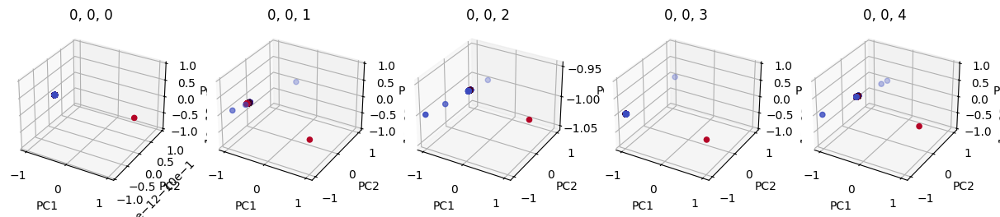

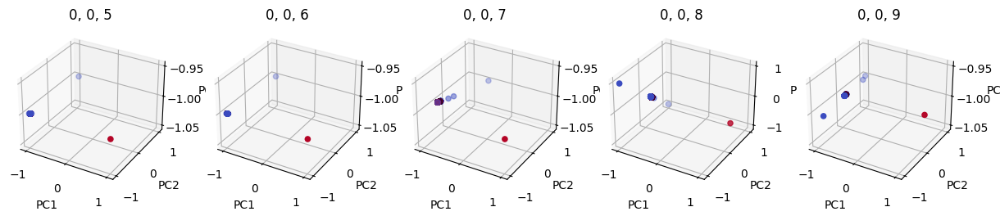

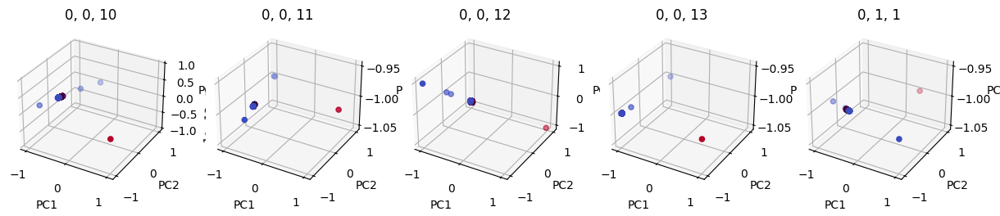

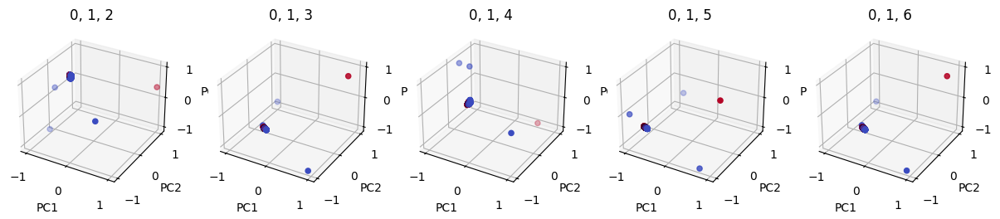

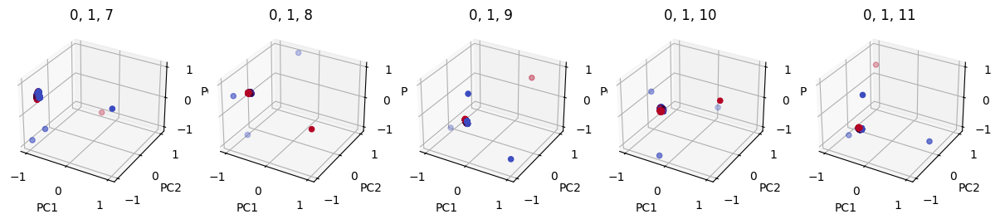

...

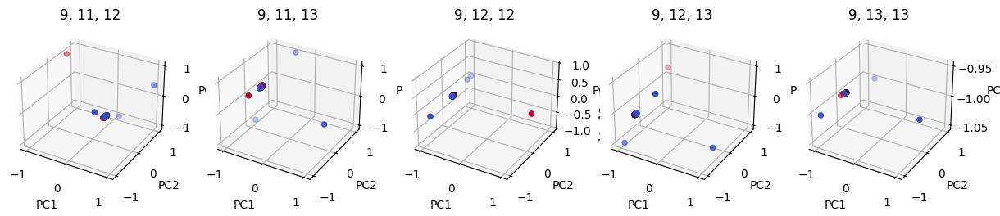

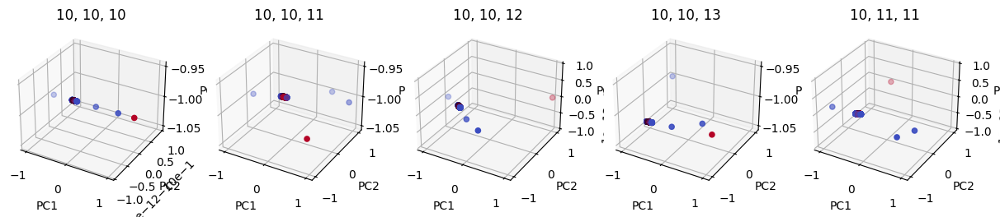

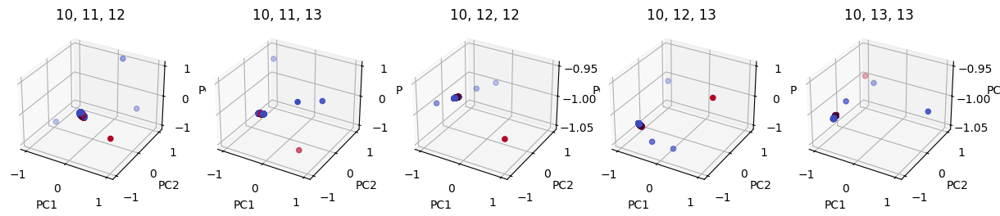

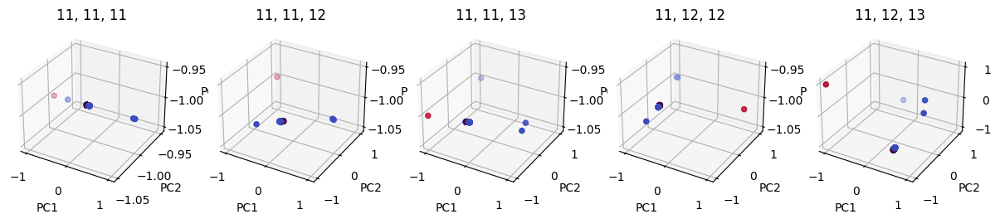

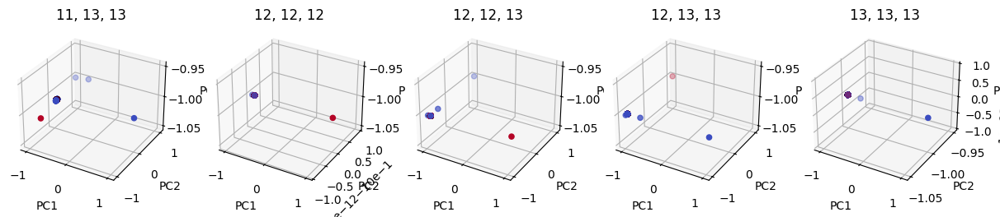

ModuleNotFoundError: No module named 'ace_tools'

<Figure size 1500x300 with 0 Axes>

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


for first_i in range(0,14):
    for second_i in range(0,14
# Assuming your data is already processed as described
columns_to_keep = [1, 4, 6, -1] 
data2 = pd.read_csv(r"H:\TemprorayCodes\Miss.Rezaei\datasets\eyeState\data.csv")
data2 = data2.iloc[:, columns_to_keep]
data2 = data2.rename(columns={"eyeDetection": "label"})

# Prepare label_column
label_column = data2.pop('label').astype('category').cat.codes

# Assuming preprocess_data() works fine and gives 3D data
preprocessed_data = preprocess_data(
    data2,
    sample_size=10000,
    standardize=True,
    reduce_dim=True,
    n_components=3
)

# Convert to DataFrame and add label
preprocessed_data = pd.DataFrame(preprocessed_data, columns=['PC1', 'PC2', 'PC3'])
preprocessed_data['label'] = label_column

# Create 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot data points: red for class 0 and blue for class 1
ax.scatter(
    preprocessed_data['PC1'], 
    preprocessed_data['PC2'], 
    preprocessed_data['PC3'], 
    c=preprocessed_data['label'], cmap='coolwarm'
)

# Set labels for axes
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

# Show plot
plt.show()


In [87]:
distances_df

,first_i,second_i,third_i,avg_distance
0,0,0,0,0.000547
1,0,0,1,0.012508
2,0,0,2,0.009597
3,0,0,3,0.000799
4,0,0,4,0.008267
...,...,...,...,...
555,11,13,13,0.009210
556,12,12,12,0.000746
557,12,12,13,0.001022
558,12,13,13,0.001035


In [90]:
sorted_distances_df = distances_df.sort_values(by='avg_distance', ascending=False)

# Display the sorted DataFrame
print(sorted_distances_df)

     first_i  second_i  third_i  avg_distance
303        3         5       13      0.054317
411        5         6       13      0.041712
182        1         9       10      0.038313
223        2         4        8      0.038078
29         0         2        4      0.037007
..       ...       ...      ...           ...
504        8         8        8      0.000441
559       13        13       13      0.000391
395        5         5        5      0.000343
440        6         6        6      0.000326
274        3         3        3      0.000311

[560 rows x 4 columns]


In [89]:
!pip install ace-tools


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [88]:
import ace_tools as tools; tools.display_dataframe_to_user(name="Class Separation Distances", dataframe=distances_df)

ModuleNotFoundError: No module named 'ace_tools'

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Set the number of plots per row (5 per row)
plots_per_row = 5
# Total number of plots to show (15 for example)
total_plots = 15
# Create a figure with enough width to accommodate 5 plots in a row
fig = plt.figure(figsize=(15, 3))  # You can adjust the height based on the plots

# Initialize plot index
plot_index = 1

for first_i in range(0, 14):
    for second_i in range(first_i, 14):
        for third_i in range(second_i, 14):
            # Assuming your data is already processed as described
            columns_to_keep = [first_i, second_i, third_i, -1] 
            data2 = pd.read_csv(r"H:\TemprorayCodes\Miss.Rezaei\datasets\eyeState\data.csv")
            data2 = data2.iloc[:, columns_to_keep]
            data2 = data2.rename(columns={"eyeDetection": "label"})
            
            # Prepare label_column
            label_column = data2.pop('label').astype('category').cat.codes
            
            # Assuming preprocess_data() works fine and gives 3D data
            preprocessed_data = preprocess_data(
                data2,
                sample_size=10000,
                standardize=True,
                reduce_dim=True,
                n_components=3
            )
            
            # Convert to DataFrame and add label
            preprocessed_data = pd.DataFrame(preprocessed_data, columns=['PC1', 'PC2', 'PC3'])
            preprocessed_data['label'] = label_column
            
            # Create a 3D plot and assign to the right subplot index
            ax = fig.add_subplot(1, plots_per_row, plot_index, projection='3d')
            
            # Plot data points: red for class 0 and blue for class 1
            scatter = ax.scatter(
                preprocessed_data['PC1'], 
                preprocessed_data['PC2'], 
                preprocessed_data['PC3'], 
                c=preprocessed_data['label'], cmap='coolwarm'
            )
            
            # Set labels for axes
            ax.set_xlabel('PC1')
            ax.set_ylabel('PC2')
            ax.set_zlabel('PC3')

            # Add a title with the current values of first_i, second_i, and third_i
            ax.set_title(f"{first_i}, {second_i}, {third_i}")
            
            # Increment plot index
            plot_index += 1

            # If the row is full, start a new row
            if plot_index > plots_per_row:
                plt.subplots_adjust(hspace=0.5)
                plt.show()
                # Create a new figure for the next row of plots
                fig = plt.figure(figsize=(15, 3))
                plot_index = 1

            # Stop once we have filled all the plots
            if plot_index > total_plots:
                break

    if plot_index > total_plots:
        break


In [29]:
preprocessed_data.shape

(45312, 4)

In [54]:
data2['label']  = label_column
columns_to_keep = [0,1, -1]
data2 = data2.iloc[:, columns_to_keep]

C:\Users\Morteza\AppData\Local\Temp\ipykernel_22660\83023765.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['label']  = label_column


In [10]:
data2


,F3,O1,O2
0,4289.23,4096.92,4641.03
1,4293.85,4097.44,4638.97
2,4295.38,4096.92,4630.26
3,4296.41,4097.44,4630.77
4,4292.31,4095.90,4627.69
...,...,...,...
14975,4245.64,4074.87,4625.64
14976,4245.13,4073.33,4621.54
14977,4246.67,4072.82,4623.59
14978,4251.28,4080.51,4628.72


In [19]:
columns_to_keep = [1,2,3, -1]

data2 = pd.read_csv(r"H:\TemprorayCodes\Miss.Rezaei\datasets\eyeState\data.csv")
data2 = data2.iloc[:, columns_to_keep]
# data2 = data2[0:30000]
# print(data2.head())

# print("Columns before renaming:", data2.columns)
data2 = data2.rename(columns={"eyeDetection": "label"})
# print("Columns after renaming:", data2.columns)
label_column = data2.pop('label').astype('category').cat.codes

filtered_data = data2

preprocessed_data = preprocess_data(
    filtered_data,
    sample_size=10000,
    standardize=True,
    reduce_dim=True,
    n_components=3
)
preprocessed_data = pd.DataFrame(preprocessed_data)

# Map the filtered label names to a binary classification
# label_column_new = filtered_data['label_names'].apply(lambda x: 0 if x == "normal" else 1)
# preprocessed_data['label'] = label_column_new
preprocessed_data['label']  = label_column

In [20]:
preprocessed_data

,PC1,PC2,PC3,label
0,0.026938,-0.895563,0.348357,0
1,0.026616,-0.896495,0.351850,0
2,0.027232,-0.895991,0.351867,0
3,0.028415,-0.894849,0.350671,0
4,0.027870,-0.894936,0.348880,0
...,...,...,...,...
14975,0.017260,-0.900602,0.335421,1
14976,0.017509,-0.900296,0.334701,1
14977,0.017505,-0.900483,0.335703,1
14978,0.018323,-0.900150,0.337392,1


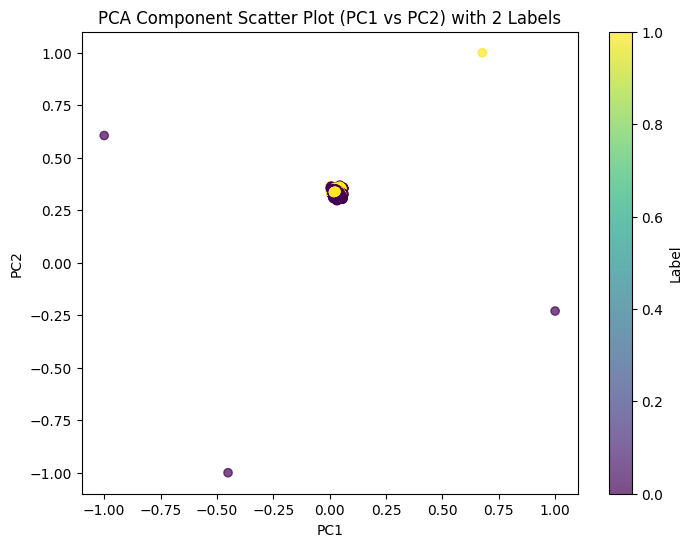

In [18]:
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame that looks like this:
# df = your_data_variable

# Scatter plot of the first two PCA components (PC1 and PC2) with two labels
plt.figure(figsize=(8, 6))
plt.scatter(preprocessed_data['PC1'], preprocessed_data['PC3'], c=preprocessed_data['label'], cmap='viridis', alpha=0.7)
plt.title('PCA Component Scatter Plot (PC1 vs PC2) with 2 Labels')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar(label='Label')
plt.show()


In [3]:
filtered_data

,F3,O1,O2
0,4289.23,4096.92,4641.03
1,4293.85,4097.44,4638.97
2,4295.38,4096.92,4630.26
3,4296.41,4097.44,4630.77
4,4292.31,4095.90,4627.69
...,...,...,...
14975,4245.64,4074.87,4625.64
14976,4245.13,4073.33,4621.54
14977,4246.67,4072.82,4623.59
14978,4251.28,4080.51,4628.72


In [4]:
preprocessed_data

,PC1,PC2,PC3,label
0,-0.947026,-0.568972,0.203939,0
1,-0.948107,-0.569803,0.205901,0
2,-0.954076,-0.570330,0.208414,0
3,-0.953640,-0.570484,0.208628,0
4,-0.956110,-0.569903,0.208024,0
...,...,...,...,...
14975,-0.961167,-0.562258,0.193471,1
14976,-0.964072,-0.562305,0.194256,1
14977,-0.962520,-0.562498,0.194272,1
14978,-0.958575,-0.563087,0.194580,1


In [29]:
attack_normal_models

[[[117, 31], [136, 138], [249, 102], [171, 174], [2, 1]],
 [[5, 4], [11, 16], [25, 3], [35, 14], [3, 4]],
 [[0, 1], [0, 1], [13, 19], [12, 5], [31, 20]],
 [[43, 11], [2, 4], [0, 2], [78, 44], [129, 145]],
 [[0, 0], [11, 3], [18, 17], [22, 6], [15, 19]],
 [[26, 49], [0, 5], [129, 46], [61, 100], [336, 217]],
 [[0, 0], [1, 2], [20, 5], [13, 21], [31, 27]],
 [[0, 1], [12, 3], [0, 3], [4, 11], [21, 7]],
 [[62, 11], [0, 3], [224, 126], [80, 141], [23, 28]],
 [[0, 0], [0, 0], [15, 4], [20, 7], [32, 42]],
 [[0, 0], [23, 4], [11, 13], [22, 4], [42, 37]],
 [[88, 9], [54, 42], [218, 256], [392, 177], [133, 155]],
 [[0, 0], [0, 1], [0, 0], [0, 2], [11, 2]],
 [[0, 1], [0, 0], [45, 15], [79, 49], [12, 23]],
 [[0, 2], [5, 4], [6, 2], [24, 18], [3, 4]],
 [[0, 0], [0, 1], [75, 59], [63, 11], [0, 3]],
 [[0, 0], [31, 37], [0, 5], [28, 25], [56, 18]],
 [[87, 90], [2, 5], [97, 38], [42, 50], [82, 27]],
 [[0, 0], [16, 6], [5, 7], [41, 36], [1, 8]],
 [[0, 1], [1, 7], [78, 49], [25, 24], [41, 12]],
 [[62, 10

In [95]:
point_locations_models[3][2][0][0]

np.float64(0.12039883250563994)

In [2]:
import numpy as np
from sklearn.metrics import silhouette_score

def calculate_clustering_scores(point_locations_models):
    """
    Calculate silhouette score and WCSS (Within-Cluster Sum of Squares) for each model in point_locations_models,
    ignoring empty clusters.
    
    Args:
        point_locations_models (list): List of models, where each model is a list of clusters,
                                       and each cluster is a list of numpy arrays (x, y, z).
    
    Returns:
        tuple: Two lists containing:
               - silhouette_scores: List of silhouette scores (or None if not computable).
               - wcss_scores: List of WCSS scores (or None if not computable).
    """
    silhouette_scores = []
    wcss_scores = []
    
    for model_idx, model in enumerate(point_locations_models):
        try:
            # Filter out empty clusters
            valid_clusters = [cluster for cluster in model if len(cluster) > 0]
            
            # Flatten points and create labels for non-empty clusters
            points = []
            labels = []
            for cluster_idx, cluster in enumerate(valid_clusters):
                for point in cluster:
                    points.append(point)
                    labels.append(cluster_idx)
            
            # Convert to numpy arrays
            points = np.array(points)
            labels = np.array(labels)
  
            # Calculate silhouette score (if applicable)
            if len(valid_clusters) < 2:
                print(f"Model {model_idx}: Fewer than 2 non-empty clusters, silhouette score not applicable.")
                silhouette_scores.append(None)
            elif len(points) < 2:
                print(f"Model {model_idx}: Fewer than 2 points, silhouette score not applicable.")
                silhouette_scores.append(None)
            elif len(np.unique(labels)) < 2:
                print(f"Model {model_idx}: All points in one cluster, silhouette score not applicable.")
                silhouette_scores.append(None)
            else:
                # Calculate silhouette score
                sil_score = silhouette_score(points, labels, metric='euclidean')
                silhouette_scores.append(sil_score)
                print(f"Model {model_idx}: Silhouette Score = {sil_score:.4f}")
            
            # Calculate WCSS
            if len(valid_clusters) < 1:
                print(f"Model {model_idx}: No non-empty clusters, WCSS not applicable.")
                wcss_scores.append(None)
            else:
                wcss = 0.0
                for cluster_idx in range(len(valid_clusters)):
                    # Get points in the current cluster
                    cluster_points = points[labels == cluster_idx]
                    if len(cluster_points) == 0:
                        continue
                    # Calculate centroid (mean) of the cluster
                    centroid = np.mean(cluster_points, axis=0)
                    # Sum of squared distances from points to centroid
                    squared_distances = np.sum((cluster_points - centroid) ** 2)
                    wcss += squared_distances
                wcss_scores.append(wcss)
                print(f"Model {model_idx}: WCSS Score = {wcss:.4f}")
        
        except Exception as e:
            print(f"Model {model_idx}: Error calculating scores: {str(e)}")
            silhouette_scores.append(None)
            wcss_scores.append(None)
    
    return silhouette_scores, wcss_scores

# Example usage
# Simulated data with an empty cluster


# Calculate both scores
silhouette_scores, wcss_scores = calculate_clustering_scores(point_locations_models)
print("Silhouette Scores for all models:", silhouette_scores)
print("WCSS Scores for all models:", wcss_scores)

Model 0: Silhouette Score = 0.0000
Model 0: WCSS Score = 0.0000
Model 1: Error calculating scores: Number of labels is 9. Valid values are 2 to n_samples - 1 (inclusive)
Model 2: Silhouette Score = 0.5196
Model 2: WCSS Score = 0.2855
Model 3: Silhouette Score = 0.6383
Model 3: WCSS Score = 0.2659
Model 4: Silhouette Score = 0.5793
Model 4: WCSS Score = 0.9865
Model 5: Silhouette Score = 0.5300
Model 5: WCSS Score = 0.0728
Model 6: Silhouette Score = 0.5568
Model 6: WCSS Score = 0.2111
Model 7: Silhouette Score = 0.5784
Model 7: WCSS Score = 0.2580
Model 8: Silhouette Score = 0.4632
Model 8: WCSS Score = 0.0397
Model 9: Silhouette Score = 0.6063
Model 9: WCSS Score = 0.0351
Model 10: Silhouette Score = 0.5936
Model 10: WCSS Score = 0.0819
Model 11: Silhouette Score = 0.4853
Model 11: WCSS Score = 0.0509
Model 12: Silhouette Score = 0.5002
Model 12: WCSS Score = 0.0434
Model 13: Silhouette Score = 0.2656
Model 13: WCSS Score = 0.0409
Model 14: Silhouette Score = 0.4127
Model 14: WCSS Sco

In [3]:
validate_sil = []
for i in silhouette_scores:
    if i is not None:
        validate_sil.append(i)
np.array(validate_sil).mean()

np.float64(0.5198046367193825)

In [15]:
scores[i]

TypeError: list indices must be integers or slices, not list

In [33]:
total_score = 0
total_number = 0
flag = 0
for i in point_locations_models:
    total_number += len(i)
    total_score += scores[flag]*len(i)
    flag+=1


In [34]:
print(total_score)
print(total_number)
print(total_score/total_number)

133.45102820951269
460
0.290110930890245


In [ ]:
point_locations_models[3]

In [35]:
print(len(using_store_times), len(create_model_times))

25 10


In [36]:
my_precision = 0.310
my_recall= 0.480
print(2*(my_precision * my_recall) / (my_precision + my_recall))

0.3767088607594936


In [7]:
def calculate_clustering_metrics(models):
    results = []
    total_precision, total_purity, total_recall, total_f1_score = 0, 0, 0, 0  # Cumulative sums for each metric

    num_classes = 2  # Number of classes
    non_zero_precisions = 0

    # Accumulators for recall across all models
    total_points_per_class_all_models = [0] * num_classes  # Total points for each class across all clusters in all models
    dominant_points_per_class_all_models = [0] * num_classes  # Total dominant points for each class across all clusters in all models

    for model in models:
        # Totals for each class across all clusters in the model
        total_points_per_class = [sum(cluster[i] for cluster in model) for i in range(num_classes)]
        total_points = sum(total_points_per_class)

        # Precision and Purity calculations
        cluster_precisions = {i: [] for i in range(num_classes)}  # Store precision for each class
        weighted_purity_sum = 0

        for cluster in model:
            # Dominant class calculation for purity
            dominant_class_count = max(cluster)
            dominant_class_index = cluster.index(dominant_class_count)
            cluster_size = sum(cluster)

            # Precision for each class in the cluster
            for i in range(num_classes):
                dominant_precision = dominant_class_count / cluster_size if cluster_size > 0 else 0
                if dominant_precision > 0:
                    cluster_precisions[dominant_class_index].append(dominant_precision)

            # Weighted purity calculation
            weighted_purity_sum += (dominant_class_count / cluster_size) * cluster_size if cluster_size > 0 else 0

            # Update dominant points for recall calculation
            for i in range(num_classes):
                if cluster[i] == dominant_class_count:  # class i is dominant in this cluster
                    dominant_points_per_class_all_models[i] += cluster[i]
            
            # Update total points for recall calculation
            for i in range(num_classes):
                total_points_per_class_all_models[i] += cluster[i]

        # Overall precision (average of cluster precisions for each class)
        overall_precisions = {
            i: sum(cluster_precisions[i]) / len(cluster_precisions[i]) if cluster_precisions[i] else 0
            for i in range(num_classes)
        }

        # Overall purity (weighted average)
        overall_purity = weighted_purity_sum / total_points if total_points > 0 else -1

        # Append the results for this model
        results.append({
            "precision": overall_precisions,
            "purity": overall_purity,
        })

        # Update cumulative metrics
        total_precision += sum(overall_precisions.values())
        total_purity += overall_purity
        non_zero_precisions += sum(1 for value in overall_precisions.values() if value != 0)

    # Calculate recall for each class across all models
    recall_per_class_all_models = [
        dominant_points_per_class_all_models[i] / total_points_per_class_all_models[i]
        if total_points_per_class_all_models[i] > 0 else 0
        for i in range(num_classes)
    ]

    # Calculate overall recall as the weighted average
    total_points = sum(total_points_per_class_all_models)
    overall_recall = sum(
        recall_per_class_all_models[i] * total_points_per_class_all_models[i]
        for i in range(num_classes)
    ) / total_points if total_points > 0 else -1

    # F1-score calculation for each class
    # f1_scores = {
    #     i: (2 * overall_precisions[i] * recall_per_class_all_models[i]) / (overall_precisions[i] + recall_per_class_all_models[i])
    #     if (overall_precisions[i] + recall_per_class_all_models[i]) > 0 else -1
    #     for i in range(num_classes)
    # }

    # Calculate overall F1 score as the average of all class F1 scores
    # overall_f1_score = sum(f1_scores[i] for i in range(num_classes)) / num_classes if num_classes > 0 else -1

    # Update cumulative F1 score
    # total_f1_score += overall_f1_score

    # Average metrics across models
    num_models = len(models)
    average_precision = total_precision / non_zero_precisions if num_models > 0 else 0
    average_purity = total_purity / num_models if num_models > 0 else 0
    average_metrics = {
        "average_precision": average_precision,
        "average_purity": average_purity,
        "average_recall": overall_recall,  # Global recall already calculated
        "average_f1_score": 2*(average_precision * overall_recall) / (average_precision + overall_recall)
    }

    return results, average_metrics

# Run the function and print results
metrics_results, average_metrics = calculate_clustering_metrics(attack_normal_models)
for idx, result in enumerate(metrics_results, start=1):
    print(f"Model {idx}: ")
    for item in result:
        print(f"{item}: {result[item]}")
    
print(f"Average metrics: {average_metrics}")

KeyError: 4

In [31]:
average_metrics

{'average_precision': 0.6926847357529907,
 'average_purity': 0.6370426993017154,
 'average_recall': 0.6292587381720876,
 'average_f1_score': 0.6594501676789494}

In [95]:
average_metrics

{'average_precision': 0.7012064299389801,
 'average_purity': 0.7215375509371247,
 'average_recall': 0.6465700051746704,
 'average_f1_score': 0.6727807865195797}

In [144]:
results

[{'precision': {0: 0.7916666666666667,
   1: 0.7163947163947164,
   2: 0.5789473684210525,
   3: 0.5761290545203588,
   4: 0.8023809523809524,
   5: 0.6473472162405739,
   6: 0.7451563691838291},
  'purity': 0.6524678837052063},
 {'precision': {0: 1.0,
   1: 0.9166666666666667,
   2: 0.75,
   3: 0,
   4: 0.7395833333333333,
   5: 0,
   6: 0.75},
  'purity': 0.7333333333333333},
 {'precision': {0: 0.6993127705627706,
   1: 0.7347670250896057,
   2: 0.8205616373155641,
   3: 0,
   4: 0.4148471615720524,
   5: 0.46188724994948477,
   6: 0.5809647704808995},
  'purity': 0.5229835212489159},
 {'precision': {0: 0.6742559523809524,
   1: 0.605104015481374,
   2: 0.6145124716553289,
   3: 0,
   4: 0.5693558474046279,
   5: 0.9175000000000001,
   6: 0.6615324716857982},
  'purity': 0.5641025641025641},
 {'precision': {0: 0.7527333155484415,
   1: 0.4,
   2: 0.4722222222222222,
   3: 0,
   4: 0.6561018136739699,
   5: 0.875,
   6: 0.4375},
  'purity': 0.6368286445012787},
 {'precision': {0: 0.77

ValueError: x and y must have same first dimension, but have shapes (140,) and (130,)

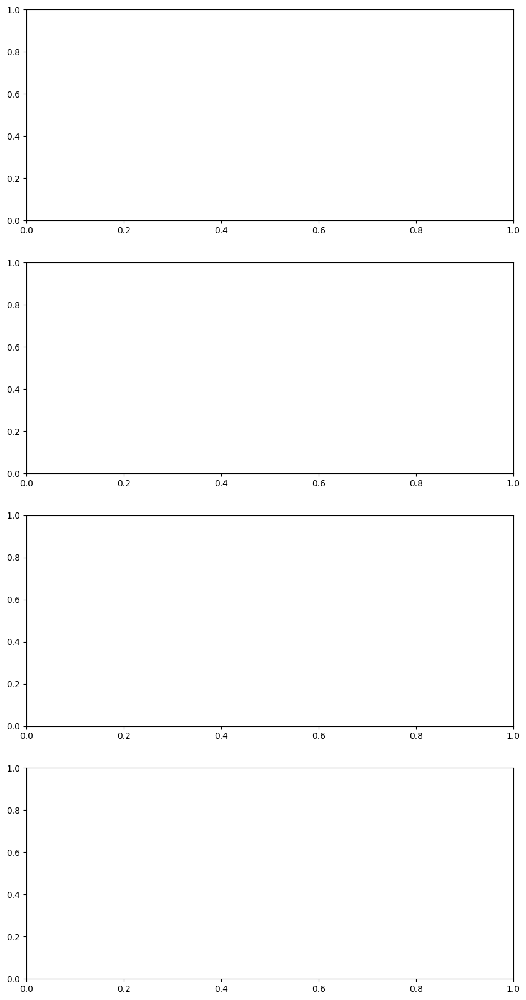

In [148]:
# Merge and sort the times to get model change times
model_change_times = sorted(using_store_times + create_model_times)

# Extract each metric into separate lists for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Plotting each metric as a line chart with model change times as the x-axis
fig, axs = plt.subplots(4, 1, figsize=(10, 20))

# Precision
axs[0].plot(model_change_times, precision_values, marker='o', label='Precision')
axs[0].set_title("Precision Across Model Changes")
axs[0].set_xlabel("Model Change Times")
axs[0].set_ylabel("Precision")
axs[0].grid()

# Purity
axs[1].plot(model_change_times, purity_values, marker='o', color='orange', label='Purity')
axs[1].set_title("Purity Across Model Changes")
axs[1].set_xlabel("Model Change Times")
axs[1].set_ylabel("Purity")
axs[1].grid()

# Recall
axs[2].plot(model_change_times, recall_values, marker='o', color='green', label='Recall')
axs[2].set_title("Recall Across Model Changes")
axs[2].set_xlabel("Model Change Times")
axs[2].set_ylabel("Recall")
axs[2].grid()

# F1 Score
axs[3].plot(model_change_times, f1_score_values, marker='o', color='red', label='F1 Score')
axs[3].set_title("F1 Score Across Model Changes")
axs[3].set_xlabel("Model Change Times")
axs[3].set_ylabel("F1 Score")
axs[3].grid()

# Show the plot with new x-axis
plt.tight_layout()
plt.show()

In [6]:
len(attack_normal_models)

76

In [352]:
preprocessed_data.max()

PC1      1.0
PC2      1.0
PC3      1.0
label    1.0
dtype: float64

In [8]:
len(numbers_of_clusters)

494019

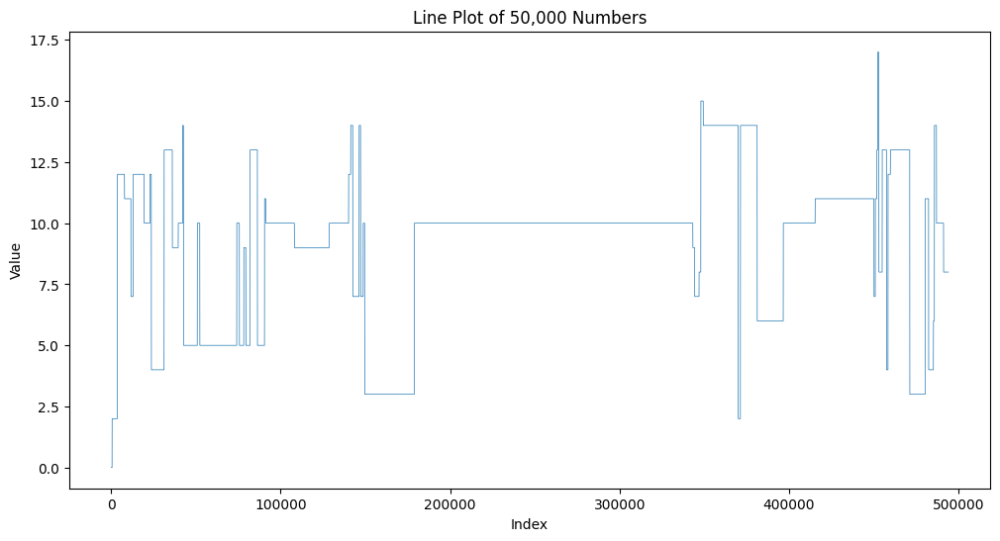

In [9]:
plt.figure(figsize=(12, 6))  # Set the figure size for better visibility
plt.plot(numbers_of_clusters, linewidth=0.5)  # Plot with a smaller line width
plt.title('Line Plot of 50,000 Numbers')
plt.xlabel('Index')
plt.ylabel('Value')
plt.grid(False)
plt.show()

In [9]:
label_column = label_column
hange_indices = label_column.ne(label_column.shift())  # Finds where the label changes

# Get the indices and corresponding labels where the changes occur
start_indices = label_column.index[hange_indices]
labels_at_changes = label_column[hange_indices]

# Combine indices and labels into a DataFrame
result = pd.DataFrame({'Index': start_indices, 'Label': labels_at_changes})

# If you have a label dictionary and want to map numeric labels to their string representation
# Assuming label_dict contains the mapping from numbers to label names
result['Label_Name'] = result['Label'].map(label_dict_old)


C:\Users\Morteza\AppData\Local\Temp\ipykernel_21088\1017027407.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}


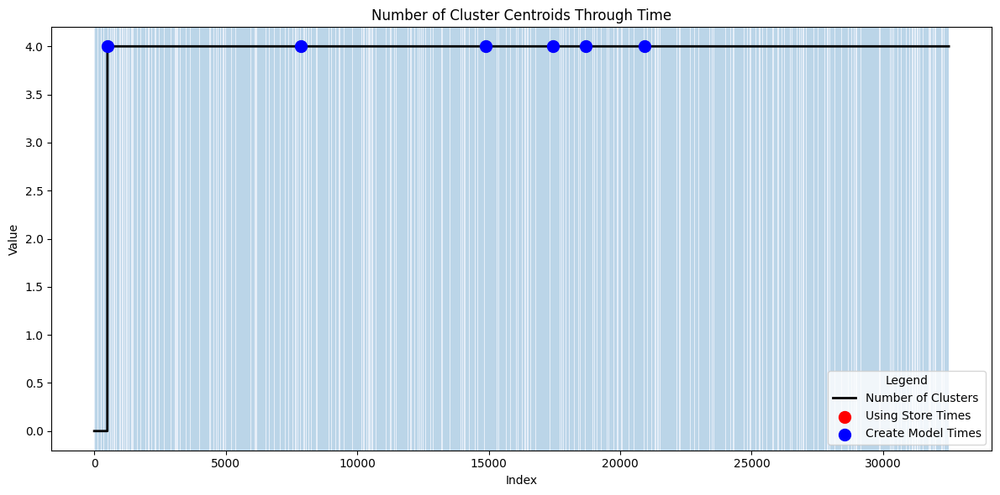

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Define the color mapping for each label type using the unique label names
unique_labels = result['Label_Name'].unique()
color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}

# Plot the existing data
plt.figure(figsize=(12,6))  # Increase the width of the figure for better visibility
plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')  # Main plot
plt.title('Number of Cluster Centroids Through Time')
plt.xlabel('Index')
plt.ylabel('Value')

# Add colored background regions based on label changes
prev_index = result['Index'].iloc[0]  # Start from the first index
prev_label = result['Label_Name'].iloc[0]  # Start from the first label

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    
    # Add a shaded area between the previous and current indices
    plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)  # Use alpha for transparency
    
    # Update previous index and label for the next iteration
    prev_index = current_index
    prev_label = current_label

# Add the last span from the last change point to the end of the plot
plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)

# Create legend handles manually for the label types
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=2, linestyle='-', alpha=0.3) for label in unique_labels]

# Add legend for the label types
plt.legend(legend_handles, unique_labels, title='Label Types', loc='upper right')

# Add red big dots for using_store_times
plt.scatter(using_store_times, [numbers_of_clusters[i] for i in using_store_times], 
            color='red', s=100, label='Using Store Times', zorder=5)

# Add blue big dots for create_model_times
plt.scatter(create_model_times, [numbers_of_clusters[i] for i in create_model_times], 
            color='blue', s=100, label='Create Model Times', zorder=5)

# Update legend to include the new dots
plt.legend(title='Legend', loc='lower right')

plt.grid(False)
plt.tight_layout()
plt.savefig('changes.jpg', format='jpg')
plt.show()

In [10]:
numbers_of_clusters

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


C:\Users\Morteza\AppData\Local\Temp\ipykernel_17860\841576904.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}


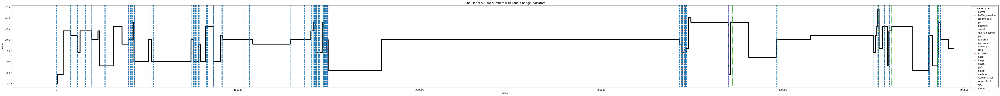

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Define the color mapping for each label type using the unique label names
unique_labels = result['Label_Name'].unique()
color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}

# Plot the existing data
plt.figure(figsize=(60, 6))  # Increase the width of the figure for better visibility
plt.plot(numbers_of_clusters, linewidth=4, color="black", label='Number of Clusters')  # Your main plot
plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
plt.xlabel('Index')
plt.ylabel('Value')

# Overlay the vertical dashed lines at the change points
lines = {}  # Dictionary to keep track of the line handles for the legend
for _, row in result.iterrows():
    # Draw dashed lines and store the line handle in lines dict for the first occurrence of each label
    line_width = 2 if row['Label_Name'] == 'normal' else 0.75  # Thicker lines for "normal"
    line = plt.axvline(x=row['Index'], linestyle='--', color=color_map[row['Label_Name']], linewidth=line_width)
    if row['Label_Name'] not in lines:
        lines[row['Label_Name']] = line  # Save the line handle for this label type

# Add legend for the label types using the line handles
plt.legend(lines.values(), lines.keys(), title='Label Types', loc='upper right')

plt.grid(False)
plt.tight_layout()
plt.savefig('changes.jpg', format='jpg')
plt.show()


C:\Users\Morteza\AppData\Local\Temp\ipykernel_17860\1725502877.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}


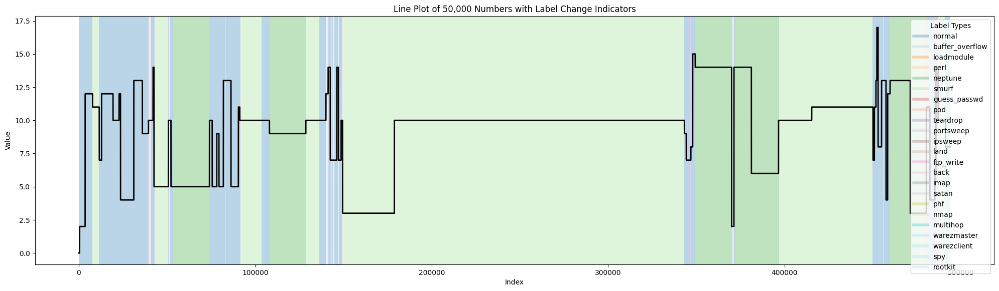

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# Define the color mapping for each label type using the unique label names
unique_labels = result['Label_Name'].unique()
color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}

# Plot the existing data
plt.figure(figsize=(20, 6))  # Increase the width of the figure for better visibility
plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')  # Main plot
plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
plt.xlabel('Index')
plt.ylabel('Value')

# Add colored background regions based on label changes
prev_index = result['Index'].iloc[0]  # Start from the first index
prev_label = result['Label_Name'].iloc[0]  # Start from the first label

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    
    # Add a shaded area between the previous and current indices
    plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)  # Use alpha for transparency
    
    # Update previous index and label for the next iteration
    prev_index = current_index
    prev_label = current_label

# Add the last span from the last change point to the end of the plot
plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)

# Create legend handles manually for the label types
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, linestyle='-', alpha=0.3) for label in unique_labels]

# Add legend for the label types
plt.legend(legend_handles, unique_labels, title='Label Types', loc='upper right')

plt.grid(False)
plt.tight_layout()
plt.savefig('changes.jpg', format='jpg')
plt.show()


C:\Users\Morteza\AppData\Local\Temp\ipykernel_24528\1670141311.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}


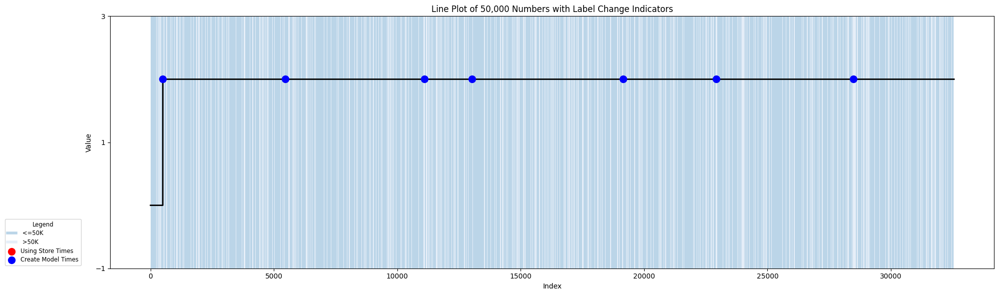

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Define the color mapping for each label type using the unique label names
unique_labels = result['Label_Name'].unique()
color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}

# Plot the existing data
plt.figure(figsize=(20, 6))  # Increase the width of the figure for better visibility
plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')  # Main plot
plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
plt.xlabel('Index')
plt.ylabel('Value')

# Add colored background regions based on label changes
prev_index = result['Index'].iloc[0]  # Start from the first index
prev_label = result['Label_Name'].iloc[0]  # Start from the first label

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    
    # Add a shaded area between the previous and current indices
    plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)  # Use alpha for transparency
    
    # Update previous index and label for the next iteration
    prev_index = current_index
    prev_label = current_label

# Add the last span from the last change point to the end of the plot
plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)

# Create legend handles manually for the label types
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, linestyle='-', alpha=0.3, label=label) for label in unique_labels]

# Add red big dots for using_store_times
red_dots = plt.scatter(using_store_times, [numbers_of_clusters[i] for i in using_store_times], 
                       color='red', s=100, label='Using Store Times', zorder=5)

# Add blue big dots for create_model_times
blue_dots = plt.scatter(create_model_times, [numbers_of_clusters[i] for i in create_model_times], 
                        color='blue', s=100, label='Create Model Times', zorder=5)

# Update legend to include the new dots
legend_handles.extend([red_dots, blue_dots])

# Show combined legend
plt.legend(handles=legend_handles, title='Legend', loc='lower right',
              fontsize='small',
    title_fontsize='small',
    labelspacing=0.4, 
    handlelength=1.5 ,
          bbox_to_anchor=(-0.03, 0)) 
y_min, y_max = plt.ylim()  # Get current y-axis limits
plt.yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1, 2))  # Set y-ticks from min to max with step of 2


plt.grid(False)
plt.tight_layout()
plt.savefig('changes_1.jpg', format='jpg')
plt.show()


In [15]:
model_change_times

[499,
 3612,
 7827,
 11623,
 12942,
 19423,
 22828,
 23669,
 26249,
 31205,
 34101,
 36050,
 36670,
 39532,
 42114,
 42644,
 50787,
 52267,
 74073,
 75630,
 78223,
 79449,
 81958,
 86271,
 90468,
 91280,
 92290,
 102688,
 108079,
 128695,
 140087,
 141329,
 142538,
 146279,
 147168,
 148694,
 149559,
 178875,
 199504,
 219503,
 239521,
 259554,
 279658,
 299673,
 319671,
 339688,
 343241,
 344317,
 345357,
 346245,
 346911,
 347960,
 349386,
 370016,
 371332,
 381216,
 396608,
 415419,
 434273,
 450145,
 450922,
 451813,
 452345,
 453024,
 454995,
 457534,
 458436,
 459828,
 471262,
 480366,
 482388,
 485232,
 485809,
 487036,
 487777,
 491214]

In [18]:
metrics_results

[{'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0}]

In [58]:
old_metrics_results = metrics_results

In [16]:
metrics_results= old_metrics_results

C:\Users\Morteza\AppData\Local\Temp\ipykernel_16996\269512808.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}


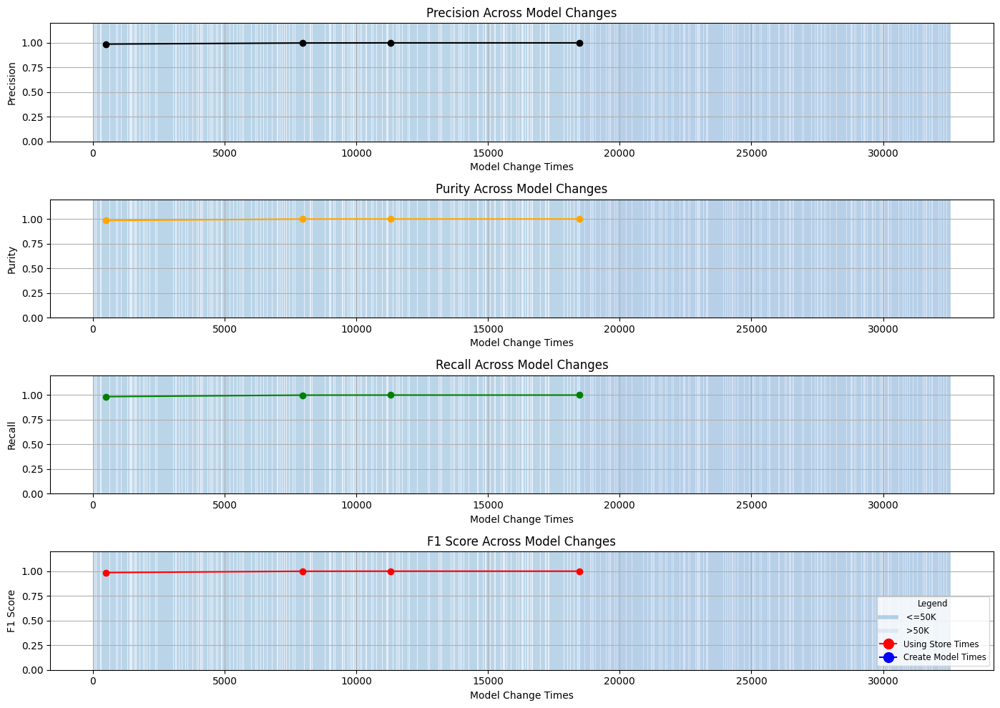

In [59]:
import matplotlib.pyplot as plt
import numpy as np

# Sample metrics data for demonstration (replace with actual data
model_change_times = sorted(using_store_times + create_model_times)

# its sooooooooooooooooooooooooooooo importantttttttttttttttttttttttttttttttttttttttttttttttttttttttttt
# model_change_times= model_change_times[1:]
# metrics_results = metrics_results[:-1]
# Assuming `result` DataFrame with `Index` and `Label_Name` columns
unique_labels = result['Label_Name'].unique()
color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}

# Extract each metric for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Plotting setup
fig, axs = plt.subplots(4, 1, figsize=(14, 10))

# Add background shading for label changes based on `result`
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    for ax in axs:
        ax.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)
    prev_index = current_index
    prev_label = current_label

# Final span from last change to end
for ax in axs:
    ax.axvspan(prev_index, model_change_times[-1], facecolor=color_map[prev_label], alpha=0.3)

# Plot each metric
x_values = model_change_times[:len(precision_values)]
axs[0].plot(x_values, precision_values, marker='o', color='black', label='Precision')
axs[0].set_title("Precision Across Model Changes")
axs[0].set_xlabel("Model Change Times")
axs[0].set_ylabel("Precision")
axs[0].set_ylim(0, 1.2)
# axs[0].set_xlim(0, 50000)
axs[0].grid()

axs[1].plot(x_values, purity_values, marker='o', color='orange', label='Purity')
axs[1].set_title("Purity Across Model Changes")
axs[1].set_xlabel("Model Change Times")
axs[1].set_ylabel("Purity")
axs[1].set_ylim(0, 1.2)
# axs[1].set_xlim(0, 50000)
axs[1].grid()

axs[2].plot(x_values, recall_values, marker='o', color='green', label='Recall')
axs[2].set_title("Recall Across Model Changes")
axs[2].set_xlabel("Model Change Times")
axs[2].set_ylabel("Recall")
axs[2].set_ylim(0, 1.2)
# axs[2].set_xlim(0, 50000)
axs[2].grid()

axs[3].plot(x_values, f1_score_values, marker='o', color='red', label='F1 Score')
axs[3].set_title("F1 Score Across Model Changes")
axs[3].set_xlabel("Model Change Times")
axs[3].set_ylabel("F1 Score")
axs[3].set_ylim(0, 1.2)
# axs[3].set_xlim(0, 50000)
axs[3].grid()

# Add markers for create and using store times
# for ax in axs:
#     ax.scatter(using_store_times, [precision_values[0]] * len(using_store_times), color='red', s=100, label='Using Store Times', zorder=5)
#     ax.scatter(create_model_times, [precision_values[0]] * len(create_model_times), color='blue', s=100, label='Create Model Times', zorder=5)

# Custom legend for labels and events
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, alpha=0.3, label=label) for label in unique_labels]
legend_handles.append(plt.Line2D([0], [0], color='red', marker='o', markersize=10, label='Using Store Times'))
legend_handles.append(plt.Line2D([0], [0], color='blue', marker='o', markersize=10, label='Create Model Times'))

# Display legend
axs[-1].legend(handles=legend_handles, title='Legend', loc='lower right', fontsize='small', title_fontsize='small')

plt.tight_layout()
plt.show()


In [19]:
metrics_results

[{'precision': 0.9997105643994211,
  'purity': 0.9994464433988375,
  'recall': 0.9994464433988375,
  'f1_score': 0.9995784864517996},
 {'precision': 0.970103487619304,
  'purity': 0.9907473309608541,
  'recall': 0.9907473309608541,
  'f1_score': 0.9803167400675477},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 0.909500355941597,
  'purity': 0.9854960654220027,
  'recall': 0.9854960654220027,
  'f1_score': 0.9459743693187448},
 {'precision': 0.936360195844912,
  'purity': 0.9809104258443465,
  'recall': 0.9809104258443465,
  'f1_score': 0.9581177201168128},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 1.0, 'purity': 1.0, 'recall': 1.0, 'f1_score': 1.0},
 {'precision': 0.9647808768680067,
  'purity': 0.9810330912025828,
  'recall': 0.9810330912025828,
  'f1_score': 0.9728391115471969},
 {'precision': 0.9989743589743589,
  'purity': 0.999654696132

In [20]:
# Sample metrics data for demonstration (replace with actual data)
model_change_times = sorted(using_store_times + create_model_times)
model_change_times = model_change_times[1:]  # Ensure it matches your data
# metrics_results = metrics_results[:-1]  # Ensure it matches your data

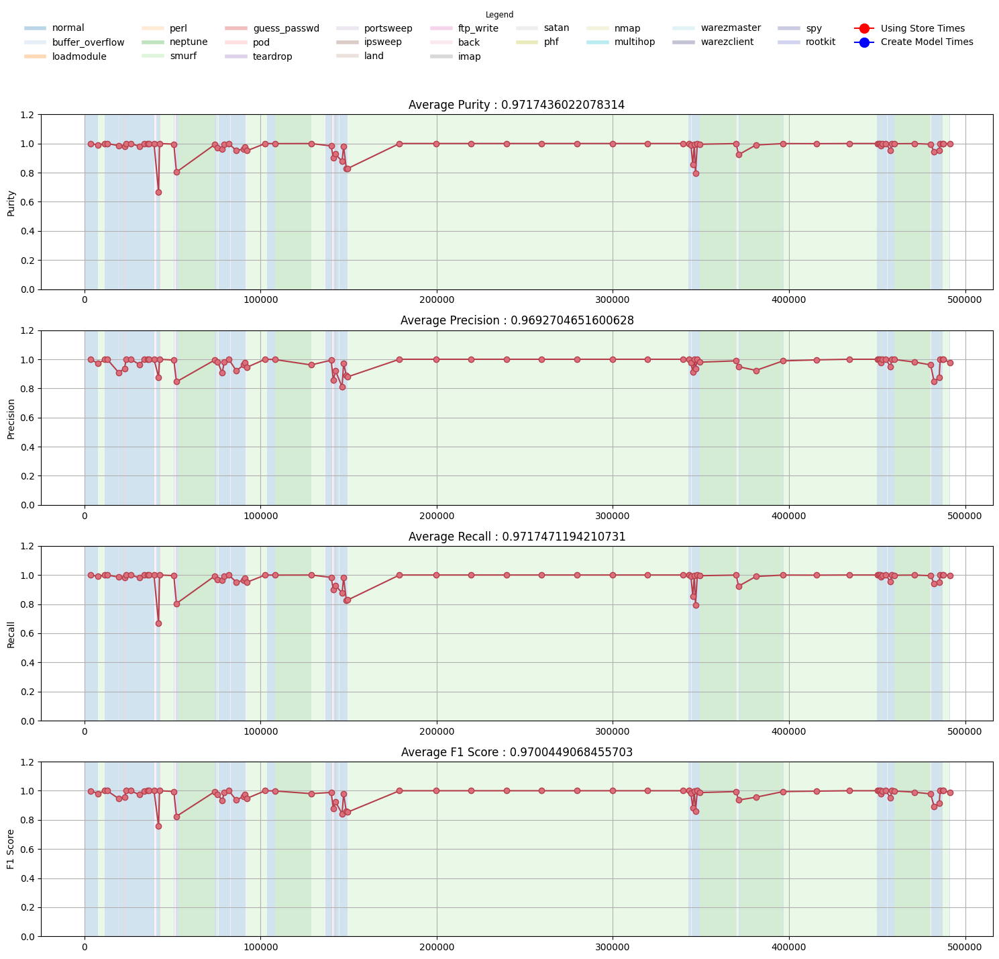

In [33]:
import matplotlib.pyplot as plt
import numpy as np



# Assuming `result` DataFrame with `Index` and `Label_Name` columns
unique_labels = result['Label_Name'].unique()
colors = [plt.cm.tab20(i) for i in range(20)] + [plt.cm.tab20b(i) for i in range(20)] + [plt.cm.tab20c(i) for i in range(20)]
color_map = {label: colors[i % len(colors)] for i, label in enumerate(unique_labels)}

line_color = '#b53e4b'
dot_color = '#db707c'  

# Extract each metric for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Plotting setup
fig, axs = plt.subplots(4, 1, figsize=(15, 13))

# Add background shading for label changes based on `result`
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    for ax in axs:
        ax.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.2)
    prev_index = current_index
    prev_label = current_label

# Final span from last change to end
for ax in axs:
    ax.axvspan(prev_index, model_change_times[-1], facecolor=color_map[prev_label], alpha=0.2)

# Plot each metric with y-axis set between 0 and 1.2
x_values = model_change_times[:len(precision_values)]



axs[0].plot(x_values, purity_values, marker='o', color=line_color, markerfacecolor=dot_color , label='Purity')
axs[0].set_title(f"Average Purity : {average_metrics['average_purity']}")
# axs[0].set_xlabel("Model Change Times")
axs[0].set_ylabel("Purity")
axs[0].set_ylim(0, 1.2)
axs[0].grid()

axs[1].plot(x_values, precision_values, marker='o', color=line_color, markerfacecolor=dot_color , label='Precision')
axs[1].set_title(f"Average Precision : {average_metrics['average_precision']}")
# axs[1].set_xlabel("Model Change Times")
axs[1].set_ylabel("Precision")
axs[1].set_ylim(0, 1.2)
axs[1].grid()



axs[2].plot(x_values, recall_values, marker='o', color=line_color, markerfacecolor=dot_color , label='Recall')
axs[2].set_title(f"Average Recall : {average_metrics['average_recall']}")
# axs[2].set_xlabel("Model Change Times")
axs[2].set_ylabel("Recall")
axs[2].set_ylim(0, 1.2)
axs[2].grid()

axs[3].plot(x_values, f1_score_values, marker='o', color=line_color, markerfacecolor=dot_color , label='F1 Score')
axs[3].set_title(f"Average F1 Score : {average_metrics['average_f1_score']}")
# axs[3].set_xlabel("Model Change Times")
axs[3].set_ylabel("F1 Score")
axs[3].set_ylim(0, 1.2)
axs[3].grid()

# Custom legend for labels and events
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, alpha=0.3, label=label) for label in unique_labels]
legend_handles.append(plt.Line2D([0], [0], color='red', marker='o', markersize=10, label='Using Store Times'))
legend_handles.append(plt.Line2D([0], [0], color='blue', marker='o', markersize=10, label='Create Model Times'))

# Display legend horizontally at the top
fig.legend(handles=legend_handles, title='Legend', loc='upper center', ncol=10, fontsize='medium',
           title_fontsize='small', bbox_to_anchor=(0.5, 1.1), frameon=False)

plt.tight_layout()
plt.savefig("measures.jpg", format='jpg', bbox_inches='tight')
plt.show()


In [30]:
average_metrics


{'average_precision': 1.0,
 'average_purity': 1.0,
 'average_recall': 1.0,
 'average_f1_score': 1.0}

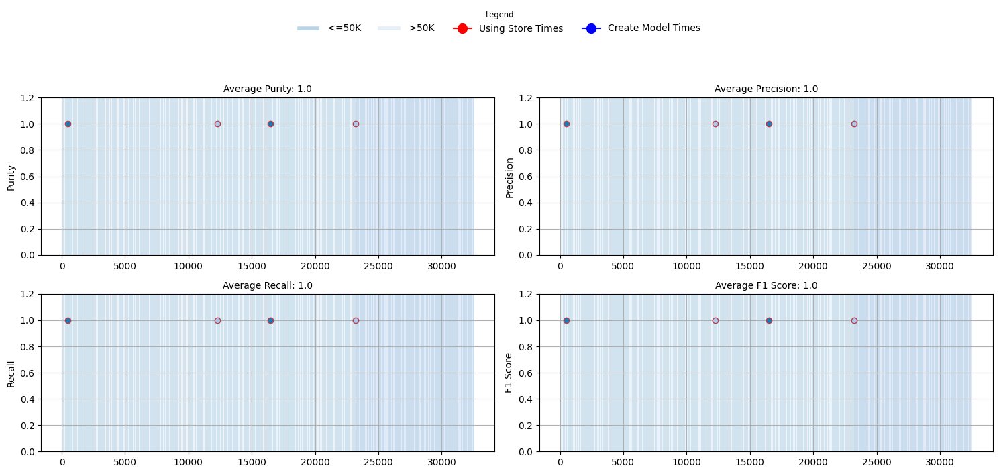

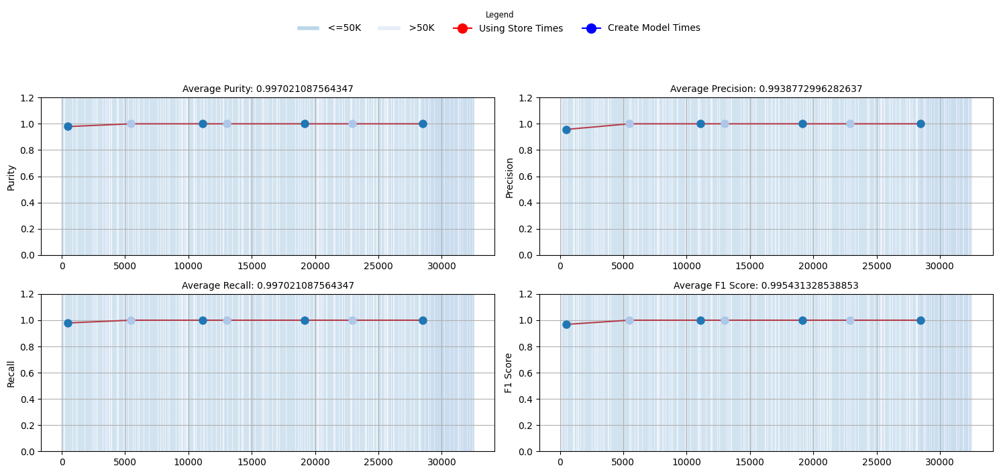

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `result` DataFrame with `Index` and `Label_Name` columns
unique_labels = result['Label_Name'].unique()
colors = [plt.cm.tab20(i) for i in range(20)] + [plt.cm.tab20b(i) for i in range(20)] + [plt.cm.tab20c(i) for i in range(20)]
color_map = {label: colors[i % len(colors)] for i, label in enumerate(unique_labels)}

line_color = '#b53e4b'
dot_color = '#db707c'

# Extract each metric for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Plotting setup with 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(15, 6))

# Add background shading for label changes based on `result`
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    for ax_row in axs:
        for ax in ax_row:
            ax.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.2)
    prev_index = current_index
    prev_label = current_label

# Final span from last change to end
for ax_row in axs:
    for ax in ax_row:
        ax.axvspan(prev_index, model_change_times[-1], facecolor=color_map[prev_label], alpha=0.2)

# Prepare the x-values
# x_values = model_change_times[:len(precision_values)]
x_values = model_change_times
# Plot each metric with y-axis set between 0 and 1.2
metrics = [
    (axs[0, 0], purity_values, "Purity", f"Average Purity: {average_metrics['average_purity']}"),
    (axs[0, 1], precision_values, "Precision", f"Average Precision: {average_metrics['average_precision']}"),
    (axs[1, 0], recall_values, "Recall", f"Average Recall: {average_metrics['average_recall']}"),
    (axs[1, 1], f1_score_values, "F1 Score", f"Average F1 Score: {average_metrics['average_f1_score']}")
]

# for ax, values, ylabel, title in metrics:
#     ax.plot(x_values, values, marker='o', color=line_color, markerfacecolor=dot_color, label=ylabel)
for ax, values, ylabel, title in metrics:
    # Plot each point with dynamic color based on its label
    ax.plot(x_values, values, color=line_color, label=ylabel)
    
    # Plot each point with color based on the 'Label_Name'
    for i, x in enumerate(x_values):
        label = result['Label_Name'].iloc[i]
        ax.plot(x, values[i], marker='o', color=color_map[label], markerfacecolor=color_map[label], markersize=8)

    ax.set_title(title, fontsize=10)
    ax.set_ylabel(ylabel)
    ax.set_ylim(0, 1.2)
    ax.grid()

# Custom legend for labels and events
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, alpha=0.3, label=label) for label in unique_labels]
legend_handles.append(plt.Line2D([0], [0], color='red', marker='o', markersize=10, label='Using Store Times'))
legend_handles.append(plt.Line2D([0], [0], color='blue', marker='o', markersize=10, label='Create Model Times'))

# Display legend horizontally at the top
fig.legend(handles=legend_handles, title='Legend', loc='upper center', ncol=10, fontsize='medium',
           title_fontsize='small', bbox_to_anchor=(0.5, 1.18), frameon=False)

plt.tight_layout()
plt.savefig("measures.jpg", format='jpg', bbox_inches='tight')
plt.show()


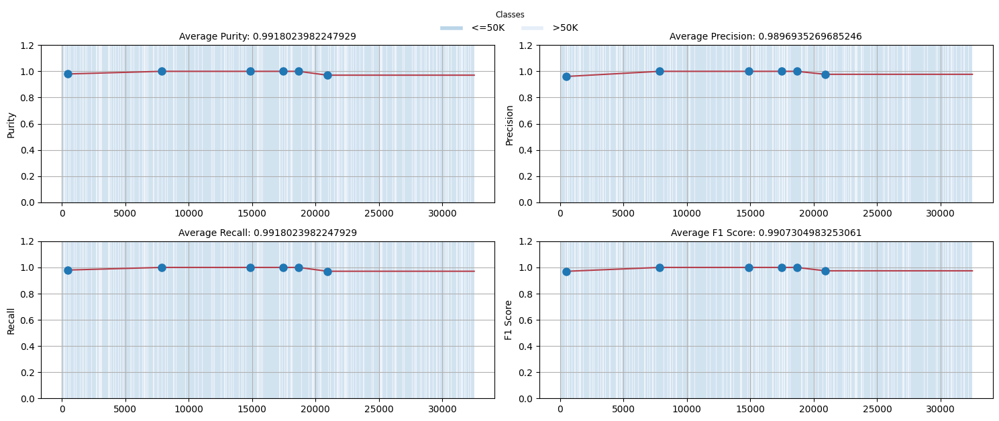

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `result` DataFrame with `Index` and `Label_Name` columns
unique_labels = result['Label_Name'].unique()
colors = [plt.cm.tab20(i) for i in range(20)] + [plt.cm.tab20b(i) for i in range(20)] + [plt.cm.tab20c(i) for i in range(20)]
color_map = {label: colors[i % len(colors)] for i, label in enumerate(unique_labels)}

line_color = '#b53e4b'
dot_color = '#db707c'

# Extract each metric for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Prepare the x-values
x_values = model_change_times

# Extend x_values and metric values to the end
extended_x = x_values + [len(preprocessed_data)]  # Add extra point
purity_values += [purity_values[-1]]
precision_values += [precision_values[-1]]
recall_values += [recall_values[-1]]
f1_score_values += [f1_score_values[-1]]

# Plotting setup with 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(15, 6))

# Add background shading for label changes based on `result`
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    for ax_row in axs:
        for ax in ax_row:
            ax.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.2)
    prev_index = current_index
    prev_label = current_label

# Final span from last change to end
for ax_row in axs:
    for ax in ax_row:
        ax.axvspan(prev_index, extended_x[-1], facecolor=color_map[prev_label], alpha=0.2)

# Plot each metric with y-axis set between 0 and 1.2
metrics = [
    (axs[0, 0], purity_values, "Purity", f"Average Purity: {average_metrics['average_purity']}"),
    (axs[0, 1], precision_values, "Precision", f"Average Precision: {average_metrics['average_precision']}"),
    (axs[1, 0], recall_values, "Recall", f"Average Recall: {average_metrics['average_recall']}"),
    (axs[1, 1], f1_score_values, "F1 Score", f"Average F1 Score: {average_metrics['average_f1_score']}")
]

for ax, values, ylabel, title in metrics:
    # Plot the line with extended x and y values
    ax.plot(extended_x, values, color=line_color, label=ylabel)
    
    # Plot each point with color based on the 'Label_Name'
    for i, x in enumerate(x_values):  # Use original x_values for bullet points
        label = result['Label_Name'].iloc[0]
        ax.plot(x, values[i], marker='o', color=color_map[label], markerfacecolor=color_map[label], markersize=8)

    ax.set_title(title, fontsize=10)
    ax.set_ylabel(ylabel)
    ax.set_ylim(0, 1.2)
    ax.grid()

# Custom legend for labels and events
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, alpha=0.3, label=label) for label in unique_labels]
# legend_handles.append(plt.Line2D([0], [0], color='red', marker='o', markersize=10, label='Using Store Times'))
# legend_handles.append(plt.Line2D([0], [0], color='blue', marker='o', markersize=10, label='Create Model Times'))

# Display legend horizontally at the top
fig.legend(handles=legend_handles, loc='upper center', ncol=2, fontsize='medium',
           title_fontsize='small', title="Classes", bbox_to_anchor=(0.51, 1.05), frameon=False)

plt.tight_layout()
plt.savefig("measures.jpg", format='jpg', bbox_inches='tight')
plt.show()


ValueError: x and y must have same first dimension, but have shapes (8,) and (7,)

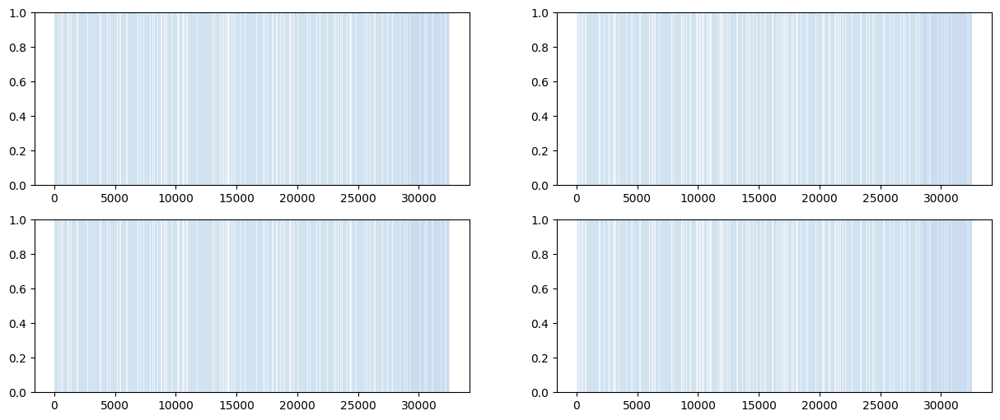

In [32]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `result` DataFrame with `Index` and `Label_Name` columns
unique_labels = result['Label_Name'].unique()
colors = [plt.cm.tab20(i) for i in range(20)] + [plt.cm.tab20b(i) for i in range(20)] + [plt.cm.tab20c(i) for i in range(20)]
color_map = {label: colors[i % len(colors)] for i, label in enumerate(unique_labels)}

line_color = '#b53e4b'
dot_color = '#db707c'

# Prepare the x-values
# x_values = model_change_times
# # Extend x_values and metric values to the end
# extended_x = x_values + [len(preprocessed_data)]  # Add extra point
# purity_values += [purity_values[-1]]
# precision_values += [precision_values[-1]]
# recall_values += [recall_values[-1]]
# f1_score_values += [f1_score_values[-1]]

# Extract each metric for plotting
precision_values = [result['precision'] for result in metrics_results]
purity_values = [result['purity'] for result in metrics_results]
recall_values = [result['recall'] for result in metrics_results]
f1_score_values = [result['f1_score'] for result in metrics_results]

# Plotting setup with 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(15, 6))

# Add background shading for label changes based on `result`
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    for ax_row in axs:
        for ax in ax_row:
            ax.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.2)
    prev_index = current_index
    prev_label = current_label

# Final span from last change to end
for ax_row in axs:
    for ax in ax_row:
        ax.axvspan(prev_index, model_change_times[-1], facecolor=color_map[prev_label], alpha=0.2)


# Plot each metric with y-axis set between 0 and 1.2
metrics = [
    (axs[0, 0], purity_values, "Purity", f"Average Purity: {average_metrics['average_purity']}"),
    (axs[0, 1], precision_values, "Precision", f"Average Precision: {average_metrics['average_precision']}"),
    (axs[1, 0], recall_values, "Recall", f"Average Recall: {average_metrics['average_recall']}"),
    (axs[1, 1], f1_score_values, "F1 Score", f"Average F1 Score: {average_metrics['average_f1_score']}")
]

for ax, values, ylabel, title in metrics:
    ax.plot(extended_x, values, marker='o', color=line_color, markerfacecolor=dot_color, label=ylabel)
    ax.set_title(title, fontsize=10)
    ax.set_ylabel(ylabel)
    ax.set_ylim(0, 1.2)
    ax.grid()

# Custom legend for labels and events
legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, alpha=0.3, label=label) for label in unique_labels]
# legend_handles.append(plt.Line2D([0], [0], color='red', marker='o', markersize=10, label='Using Store Times'))
# legend_handles.append(plt.Line2D([0], [0], color='blue', marker='o', markersize=10, label='Create Model Times'))

# Display legend horizontally at the top
fig.legend(handles=legend_handles, title='Legend', loc='upper center', ncol=10, fontsize='medium',
           title_fontsize='small', bbox_to_anchor=(0.5, 1.18), frameon=False)

plt.tight_layout()
plt.savefig("measures.jpg", format='jpg', bbox_inches='tight')
plt.show()


In [18]:
x_values

[499, 5466, 11110, 13028, 19160, 22926, 28472]

In [19]:
result

,Index,Label,Label_Name
0,0,0,<=50K
7,7,1,>50K
12,12,0,<=50K
14,14,1,>50K
15,15,0,<=50K
...,...,...,...
32554,32554,1,>50K
32555,32555,0,<=50K
32557,32557,1,>50K
32558,32558,0,<=50K


In [285]:
import pandas as pd
from tabulate import tabulate

# Define the data for each method, structured with metrics as rows
data = {
    "Metric": ["F1-score", "Purity", "Precision", "Recall"],
    "DenStream": [0.969, 1, 1, 0.966],
    "DStream": [0.9995, 1, 1, 0.999],
    "ClusTree": [0.979, 1, 1, 0.96],
    "DGStream": [0.99066, 0.9815, 0.98147, 1],
    "Our Approach": [1, 1, 1, 1]
}

# Create the DataFrame with metrics as rows and methods as columns
table = pd.DataFrame(data)
table.set_index("Metric", inplace=True)

# Generate the table in a clear, aligned format
formatted_table = tabulate(table, headers="keys", tablefmt="plain", floatfmt=".5f")
print(formatted_table)


Metric       DenStream    DStream    ClusTree    DGStream    Our Approach
F1-score       0.96900    0.99950     0.97900     0.99066         1.00000
Purity         1.00000    1.00000     1.00000     0.98150         1.00000
Precision      1.00000    1.00000     1.00000     0.98147         1.00000
Recall         0.96600    0.99900     0.96000     1.00000         1.00000


In [259]:
result

,Index,Label,Label_Name
0,0,11,normal.
7448,7448,1,buffer_overflow.
7450,7450,11,normal.


C:\Users\Morteza\AppData\Local\Temp\ipykernel_20344\3625175024.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  model_color_map = {model_index: plt.cm.get_cmap('tab20')(i) for i, model_index in enumerate(unique_models)}


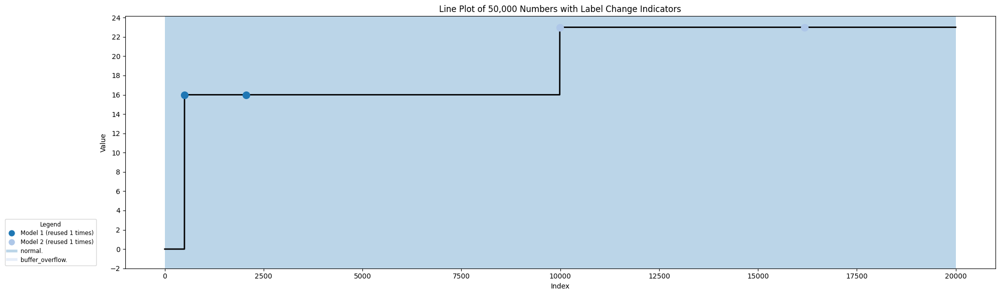

In [260]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Generate a color map for created models
unique_models = list(range(len(create_model_times)))
model_color_map = {model_index: plt.cm.get_cmap('tab20')(i) for i, model_index in enumerate(unique_models)}

# Count re-use occurrences of each model in using_store_times_index
reuse_counts = Counter(using_store_times_index)

# Plot the main line
plt.figure(figsize=(20, 6))
plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')
plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
plt.xlabel('Index')
plt.ylabel('Value')

# Add shaded regions based on label changes in 'result' dataframe
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)
    prev_index = current_index
    prev_label = current_label

plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)

# Add markers for created models
for idx, create_time in enumerate(create_model_times):
    plt.scatter(create_time, numbers_of_clusters[create_time], color=model_color_map[idx], s=100, label=f'Created Model {idx}', zorder=5)

# Add markers for using stored models with consistent color for re-used models
for idx, use_time in enumerate(using_store_times):
    model_idx = using_store_times_index[idx]  # Get the model index used at this time
    plt.scatter(use_time, numbers_of_clusters[use_time], color=model_color_map[model_idx], s=100, 
                label=f'Using Model {model_idx}', zorder=5)

# Prepare the legend
# One entry for each model in the created models list with reuse counts
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=model_color_map[idx], markersize=10,
               label=f'Model {idx+1} (reused {reuse_counts[idx]} times)' if reuse_counts[idx] > 0 else f'Model {idx+1}') 
    for idx in unique_models
]

# Add the label color legend for different label types in result
legend_handles.extend([plt.Line2D([0], [0], color=color_map[label], lw=4, linestyle='-', alpha=0.3, label=label) for label in unique_labels])

# Show legend
plt.legend(handles=legend_handles, title='Legend', loc='lower right',
           fontsize='small', title_fontsize='small', labelspacing=0.4, handlelength=1.5, bbox_to_anchor=(-0.03, 0)) 

# Set y-axis ticks
y_min, y_max = plt.ylim()
plt.yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1, 2))

# Finalize and show plot
plt.grid(False)
plt.tight_layout()
plt.savefig('changes_2.jpg', format='jpg')
plt.show()


In [261]:
using_store_times_index

[0, 1]

In [262]:
using_store_times

[2055, 16171]

C:\Users\Morteza\AppData\Local\Temp\ipykernel_20344\2179057174.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  model_color_map = {model_index: plt.cm.get_cmap('tab20c')(i) for i, model_index in enumerate(unique_models)}


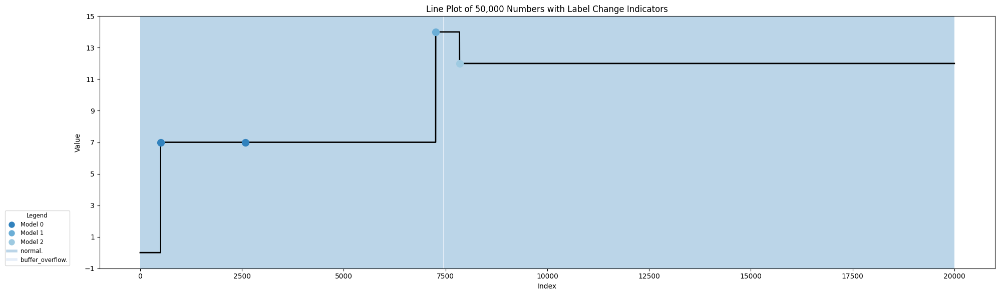

In [168]:
import matplotlib.pyplot as plt
import numpy as np

# Generate a color map for created models
unique_models = list(range(len(create_model_times)))
model_color_map = {model_index: plt.cm.get_cmap('tab20c')(i) for i, model_index in enumerate(unique_models)}

# Plot the main line
plt.figure(figsize=(20, 6))
plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')
plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
plt.xlabel('Index')
plt.ylabel('Value')

# Add shaded regions based on label changes in 'result' dataframe
prev_index = result['Index'].iloc[0]
prev_label = result['Label_Name'].iloc[0]

for i in range(1, len(result)):
    current_index = result['Index'].iloc[i]
    current_label = result['Label_Name'].iloc[i]
    plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)
    prev_index = current_index
    prev_label = current_label

plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)

# Add markers for created models
for idx, create_time in enumerate(create_model_times):
    plt.scatter(create_time, numbers_of_clusters[create_time], color=model_color_map[idx], s=100, label=f'Created Model {idx}', zorder=5)

# Add markers for using stored models with consistent color for re-used models
for idx, use_time in enumerate(using_store_times):
    model_idx = using_store_times_index[idx-1]  # Get the model index used at this time
    plt.scatter(use_time, numbers_of_clusters[use_time], color=model_color_map[model_idx], s=100, 
                label=f'Using Model {model_idx}', zorder=5)

# Prepare the legend
# One entry for each model in the created models list
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=model_color_map[idx], markersize=10, label=f'Model {idx}') 
                  for idx in unique_models]

# Add the label color legend
legend_handles.extend([plt.Line2D([0], [0], color=color_map[label], lw=4, linestyle='-', alpha=0.3, label=label) for label in unique_labels])

# Show legend
plt.legend(handles=legend_handles, title='Legend', loc='lower right',
           fontsize='small', title_fontsize='small', labelspacing=0.4, handlelength=1.5, bbox_to_anchor=(-0.03, 0)) 

# Set y-axis ticks
y_min, y_max = plt.ylim()
plt.yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1, 2))

# Finalize and show plot
plt.grid(False)
plt.tight_layout()
plt.savefig('changes.jpg', format='jpg')
plt.show()


In [169]:
using_store_times_index

[0]

In [170]:
using_store_times

[2584]

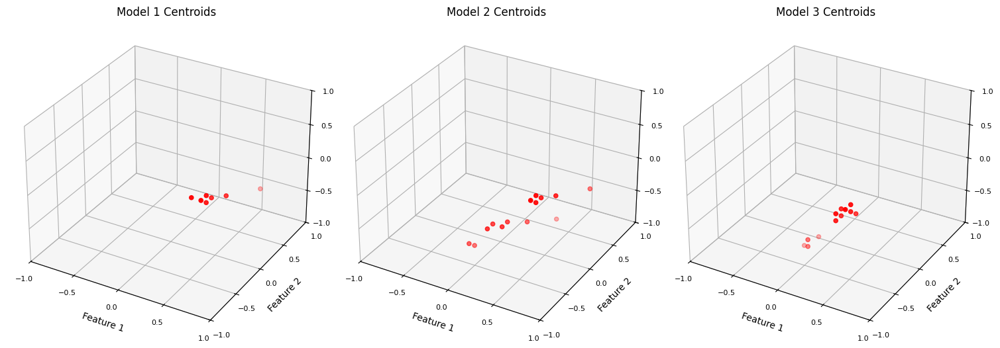

In [171]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming `models` is your list of models with centroids
num_models = len(models)
cols = 6
rows = (num_models + cols - 1) // cols  # Calculate the number of rows needed

fig = plt.figure(figsize=(5 * cols, 6 * rows))
axs = [fig.add_subplot(rows, cols, i + 1, projection='3d') for i in range(num_models)]

for idx, ax in enumerate(axs):
    model = models[idx]
    centroids = np.array([cluster.centroid for cluster in model.clusters])
    ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], marker='o', color='r')
    ax.set_title(f'Model {idx + 1} Centroids')
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')
    ax.set_zlabel('Feature 3')
    
    # Set all three dimensions (x, y, z) to range between -1 and 1
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)

    # Reduce the number of ticks on each axis
    ax.set_xticks(np.linspace(-1, 1, 5))  # Fewer ticks
    ax.set_yticks(np.linspace(-1, 1, 5))
    ax.set_zticks(np.linspace(-1, 1, 5))
    
    # Adjust tick parameters: reduce label size and increase padding
    ax.tick_params(axis='x', labelsize=8, pad=3)  # Smaller font size and padding
    ax.tick_params(axis='y', labelsize=8, pad=3)
    ax.tick_params(axis='z', labelsize=8, pad=3)

# Adjust deletion of axes to ensure no out of range errors
if num_models < rows * cols:
    for ax in axs[num_models:]:  # Get the unused axes from the list
        fig.delaxes(ax)  # Properly delete unused axes

plt.tight_layout()
plt.savefig('cluster_centroids.jpg', format='jpg')
plt.show()


In [172]:


import matplotlib.pyplot as plt
import numpy as np


preprocess = Preprocessing(r"H:\TemprorayCodes\Miss.Rezaei\data.csv")
data2, label_names = preprocess.run()


# Extract the label column from data2
label_column = data2.pop('label')

# Create a dictionary to map labels to their names
label_dict_old = {label: name for label, name in zip(label_column, label_names)}

# Map label names to the label column for filtering
data2['label'] = label_column
data2['label_names'] = label_column.map(label_dict_old)

# Filter the data to keep only rows where label_names are "normal", "neptune", or "smurf"
filtered_data = data2[data2['label_names'].isin(["normal", "neptune", "smurf"])]
# filtered_data = data2

normal_data = filtered_data[filtered_data['label_names'] == "normal"]
neptune_data = filtered_data[filtered_data['label_names'] == "neptune"]
smurf_data = filtered_data[filtered_data['label_names'] == "smurf"]

# Create function to batch data in cycles of 10,000
def create_cycled_batches(normal_data, neptune_data, smurf_data, batch_size=10000):
    # Calculate the minimum length that can be divided into batches
    min_length = min(len(normal_data), len(neptune_data), len(smurf_data))
    total_batches = min_length // batch_size
    
    # Collect batches
    batches = []
    for i in range(total_batches):
        batches.append(smurf_data[i * batch_size:(i + 1) * batch_size])
        batches.append(normal_data[i * batch_size:(i + 1) * batch_size])
        batches.append(neptune_data[i * batch_size:(i + 1) * batch_size])
 
    
    # Concatenate all batches
    return pd.concat(batches).reset_index(drop=True)

# Create cycled batches
cycled_data = create_cycled_batches(normal_data, neptune_data, smurf_data)

filtered_data = cycled_data

label_column = filtered_data["label"]

# Preprocess the filtered data
preprocessed_data = preprocess_data(
    filtered_data.drop(columns=['label_names']), 
    sample_size=10000, 
    standardize=True, 
    reduce_dim=True, 
    n_components=3
)
preprocessed_data = pd.DataFrame(preprocessed_data)

# Map the filtered label names to a binary classification
label_column_new = filtered_data['label_names'].apply(lambda x: 0 if x == "normal" else 1)
preprocessed_data['label'] = label_column_new

# Update the label dictionary to reflect the new classification
label_dict = {0: "normal", 1: "attack"}

# Uncomment if shuffling is required
# shuffled_data = preprocessed_data.sample(frac=1, random_state=42).reset_index(drop=True)

# Define the number of labels and simulate the stream
number_of_labels = 23

for decay_factor in np.arange(0.95, 0.30, -0.05):
    models, numbers_of_clusters, using_store_times, create_model_times = simulate_stream(preprocessed_data, decay_factor=decay_factor, density_threshold=0.3, cluster_radius=0.3, grid_size=0.5, test_phase=decay_factor, numberOfLabels=number_of_labels)
    # density_threshold, cluster_radious, grid_size, test_phase,
    
    
    label_column = label_column
    hange_indices = label_column.ne(label_column.shift())  # Finds where the label changes
    
    # Get the indices and corresponding labels where the changes occur
    start_indices = label_column.index[hange_indices]
    labels_at_changes = label_column[hange_indices]
    
    # Combine indices and labels into a DataFrame
    result = pd.DataFrame({'Index': start_indices, 'Label': labels_at_changes})
    
    # If you have a label dictionary and want to map numeric labels to their string representation
    # Assuming label_dict contains the mapping from numbers to label names
    result['Label_Name'] = result['Label'].map(label_dict_old)
    
    
    
    # Define the color mapping for each label type using the unique label names
    unique_labels = result['Label_Name'].unique()
    color_map = {label: plt.cm.get_cmap('tab20')(i) for i, label in enumerate(unique_labels)}
    
    # Plot the existing data
    plt.figure(figsize=(20, 6))  # Increase the width of the figure for better visibility
    plt.plot(numbers_of_clusters, linewidth=2, color="black", label='Number of Clusters')  # Main plot
    plt.title('Line Plot of 50,000 Numbers with Label Change Indicators')
    plt.xlabel('Index')
    plt.ylabel('Value')
    
    # Add colored background regions based on label changes
    prev_index = result['Index'].iloc[0]  # Start from the first index
    prev_label = result['Label_Name'].iloc[0]  # Start from the first label
    
    for i in range(1, len(result)):
        current_index = result['Index'].iloc[i]
        current_label = result['Label_Name'].iloc[i]
        
        # Add a shaded area between the previous and current indices
        plt.axvspan(prev_index, current_index, facecolor=color_map[prev_label], alpha=0.3)  # Use alpha for transparency
        
        # Update previous index and label for the next iteration
        prev_index = current_index
        prev_label = current_label
    
    # Add the last span from the last change point to the end of the plot
    plt.axvspan(prev_index, len(numbers_of_clusters), facecolor=color_map[prev_label], alpha=0.3)
    
    # Create legend handles manually for the label types
    legend_handles = [plt.Line2D([0], [0], color=color_map[label], lw=4, linestyle='-', alpha=0.3, label=label) for label in unique_labels]
    
    # Add red big dots for using_store_times
    red_dots = plt.scatter(using_store_times, [numbers_of_clusters[i] for i in using_store_times], 
                           color='red', s=100, label='Using Store Times', zorder=5)
    
    # Add blue big dots for create_model_times
    blue_dots = plt.scatter(create_model_times, [numbers_of_clusters[i] for i in create_model_times], 
                            color='blue', s=100, label='Create Model Times', zorder=5)
    
    # Update legend to include the new dots
    legend_handles.extend([red_dots, blue_dots])
    
    # Show combined legend
    plt.legend(handles=legend_handles, title='Legend', loc='lower right',
                  fontsize='small',
        title_fontsize='small',
        labelspacing=0.4, 
        handlelength=1.5 ,
              bbox_to_anchor=(-0.03, 0)) 
    y_min, y_max = plt.ylim()  # Get current y-axis limits
    plt.yticks(np.arange(np.floor(y_min), np.ceil(y_max) + 1, 2))  # Set y-ticks from min to max with step of 2
    
    
    plt.grid(False)
    plt.tight_layout()
    plt.savefig(f'changes_{decay_factor}.jpg', format='jpg')
    plt.show()




Creating initial model.
[(0, 3, 2)]
Alarm: Concept drift detected


KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Function to visualize the clusters with different markers for classes
def visualize_clusters_with_classes(record_locations_models):
    # Define a list of colors for different clusters (20 colors)
    colors = plt.cm.get_cmap('tab20', 20)  # 20 colors for 20 clusters
    markers = ['o', '^', 's', 'p', '*', 'H', 'D', '+', 'x', '|', '_', '1', '2', '3', '4', '8', 'v', '<', '>', 'p']
    
    # Create a 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Iterate over the clusters
    cluster_idx = 0
    for cluster in record_locations_models:
        for sub_cluster in cluster:
            # Check if the sub_cluster has points
            if sub_cluster:
                # Split the points and classes
                points = [point[0] for point in sub_cluster]
                classes = [point[1] for point in sub_cluster]

                # Extract x, y, z coordinates
                x = [point[0] for point in points]
                y = [point[1] for point in points]
                z = [point[2] for point in points]

                # Map classes to markers
                for class_val in set(classes):
                    # Extract points for this class
                    class_points = [(xi, yi, zi) for xi, yi, zi, c in zip(x, y, z, classes) if c == class_val]
                    
                    # Extract the x, y, z coordinates of the current class
                    class_x, class_y, class_z = zip(*class_points)

                    # Choose a color based on the cluster and marker based on class
                    cluster_color = colors(cluster_idx % 20)  # Cluster color
                    marker = markers[int(class_val) % len(markers)]  # Class marker style
                    
                    # Plot the points for this class within the current cluster
                    ax.scatter(class_x, class_y, class_z, 
                               c=[cluster_color] * len(class_x), 
                               marker=marker, 
                               label=f'Cluster {cluster_idx+1}, Class {int(class_val)}', 
                               s=30)

        cluster_idx += 1

    # Set labels
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Add a legend
    ax.legend()

    # Show the plot
    plt.savefig('record.jpg', format='jpg')
    plt.show()

# Call the visualization function
visualize_clusters_with_classes([record_locations_models[0][8]])
